# Libraries

In [17]:
try:
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn.objects as so
    import seaborn as sns
    from plotnine import *
    import os
    import re
    import geopandas as gpd
    import shapefile as shp
    from shapely.geometry import Point
except:
    !pip install os
    !pip install numpy
    !pip install pandas
    !pip install plotnine
    !pip install matplotlib
    !pip install seaborn
    !pip install re
    !pip install geopandas
    !pip install shapely
    !pip install pyshp
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn.objects as so # May be latest version of seaborn is required for this command to run.
    import seaborn as sns
    from plotnine import *
    import os
    import re
    import geopandas as gpd
    import shapefile as shp
    from shapely.geometry import Point

In [18]:
try:
    import warnings
    warnings.filterwarnings(action='ignore')
except:
    !pip install warnings
    import warnings
    warnings.filterwarnings(action='ignore')

In [19]:
path="D:\Semester 2\Data Visualization Lab\Project" #Replace by where you have kept the files

In [20]:
map_fp= path+"\map"
map_df = gpd.read_file(map_fp) 
map_df_copy = gpd.read_file(map_fp)

# Notes  

* Observations for each plot is written in the Report. This file only contains codes for the plot.  
* The sources for external Data(Data not given to us) have been mentioned in last page of report.
* Data cleaning is done when and where required. Each plot had different requirements, so data for each plot was converted to suitable format before plotting of each plot.
* Some plots are not in the report because they were used for mid evaluation and later modified.

# Fisheries

## Different Types of Fish Production

In [21]:
fish_path=(path+"\Agriculture\Fish")
os.chdir(fish_path)

In [22]:
fish_df=pd.read_csv(fish_path+"\Fish_Production.csv")

In [23]:
recent_fish_df=pd.read_csv(fish_path+'\Recent_FIsh_Production.csv')

In [24]:
def filter_df(word,pre_columns,df):
    '''
    Return subset of dataframe with only columns containing the given word
    '''
    cols=pre_columns+df.filter(like=word).columns.tolist()
    return df[cols].copy()

In [25]:
def extract_year(string):
    '''
    Extract year from, say, Marine-2009-2010
    '''
    string=string.replace(' ','')
    l=string.split('-')
    return '-'.join(l[1:])

In [26]:
pre_columns=['States or Union Territories']
marine_fish_df=filter_df('Marine',pre_columns,fish_df)
marine_fish_df.dropna(inplace=True)
marine_fish_df=marine_fish_df.melt(id_vars=['States or Union Territories'],var_name='Year',value_name="Marine_Fish_Production")
marine_fish_df['Year']=marine_fish_df['Year'].apply(extract_year)
marine_fish_df.rename(columns={"States or Union Territories":"States_or_Union_Territories"},inplace=True)
marine_fish_df

,States_or_Union_Territories,Year,Marine_Fish_Production
0,Andhra Pradesh,2007-08,254.89
1,Goa,2007-08,32.26
2,Gujarat,2007-08,644.53
3,Karnataka,2007-08,175.57
4,Kerala,2007-08,586.29
...,...,...,...
79,Andaman & Nicobar Islands,2012-13,36.43
80,Daman & Diu,2012-13,18.78
81,Lakshadweep,2012-13,12.37
82,Puducherry,2012-13,35.61


In [27]:
pre_columns=['States or Union Territories']
marine_recent_fish_df=filter_df('Marine',pre_columns,recent_fish_df)
marine_recent_fish_df=marine_recent_fish_df.melt(id_vars=['States or Union Territories'],var_name='Year',value_name="Marine_Fish_Production")
marine_recent_fish_df['Year']=marine_recent_fish_df['Year'].apply(extract_year)
marine_recent_fish_df.rename(columns={"States or Union Territories":"States_or_Union_Territories"},inplace=True)
marine_recent_fish_df["Marine_Fish_Production"]=marine_recent_fish_df["Marine_Fish_Production"]*100
marine_recent_fish_df.replace("India","Total",inplace=True)

In [28]:
marine_recent_fish_df1=marine_recent_fish_df[marine_recent_fish_df["Marine_Fish_Production"]!=0.0]

In [29]:
marine_df=pd.concat([marine_fish_df,marine_recent_fish_df1])

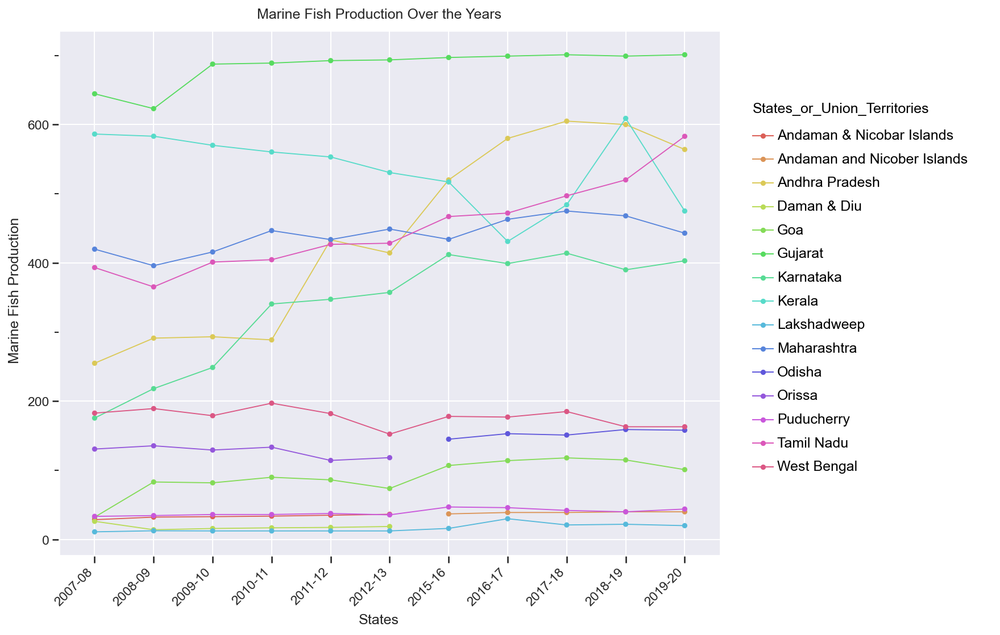

<ggplot: (136772914089)>

In [30]:
df=marine_df.loc[marine_df["States_or_Union_Territories"]!='Total',:]
df_helper=df[df["Year"]=="2012-13"].sort_values(by="Marine_Fish_Production",ascending=False)[:3]

p=(ggplot(df,aes(x="Year",y="Marine_Fish_Production",group="States_or_Union_Territories",color="States_or_Union_Territories"))+
geom_line()+
geom_point()+
labs(title="Marine Fish Production Over the Years",x="States",y="Marine Fish Production")+
theme_seaborn()+
theme(axis_text_x=element_text(angle=45, hjust=1),dpi=150,figure_size=(10,8)))
p.save("Marine Fish Production Over the Years.png",dpi=300)
p

In [31]:
df=df.groupby(by="States_or_Union_Territories").sum().reset_index()

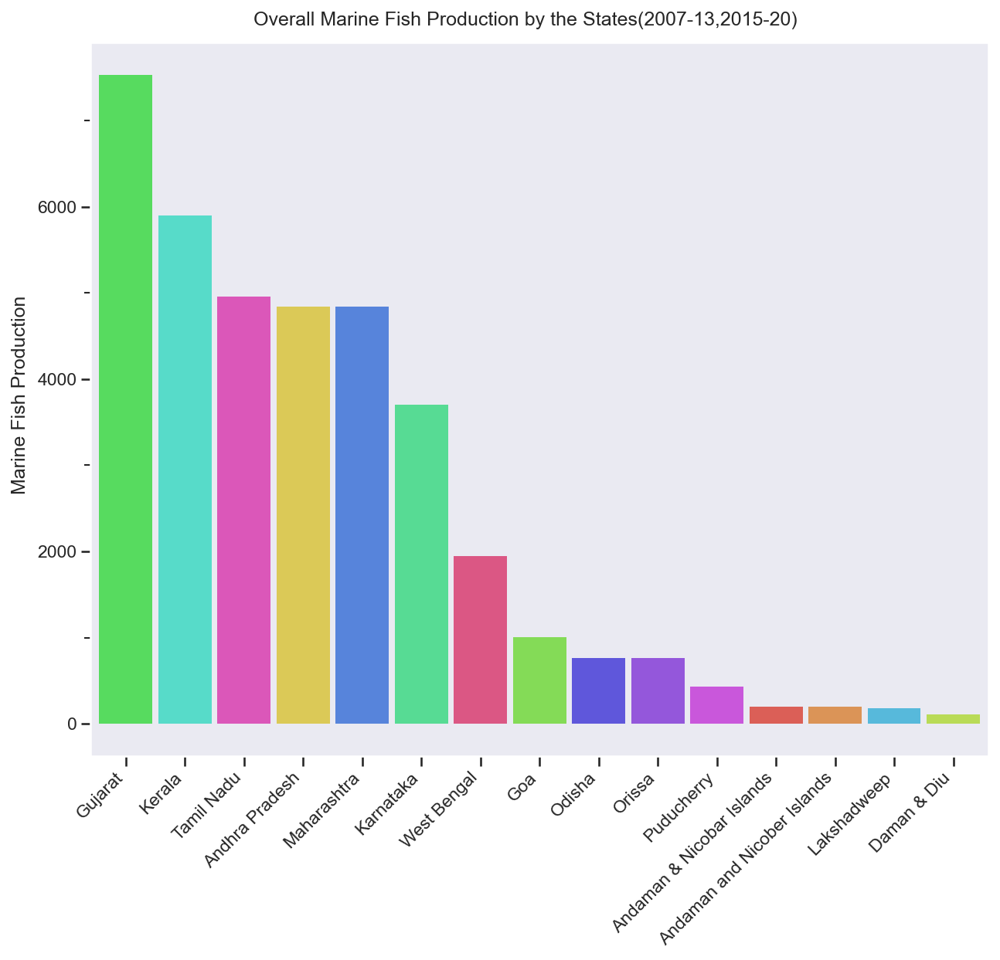

<ggplot: (136773469558)>

In [32]:
p=(ggplot(df,aes(x="reorder(States_or_Union_Territories,Marine_Fish_Production,ascending=False)",y="Marine_Fish_Production",fill="States_or_Union_Territories"))+
 geom_bar(stat='identity')+
 labs(x="",y="Marine Fish Production",title="Overall Marine Fish Production by the States(2007-13,2015-20)")+
 theme_seaborn()+
 theme(legend_position='none',panel_grid=element_blank(),axis_text_x=element_text(angle=45, hjust=1),dpi=150,figure_size=(10,8)))
p.save("Overall Marine Fish Production.png",dpi=150)
p

In [33]:
inland_fish_df=filter_df('Inland',pre_columns,fish_df)
inland_fish_df=inland_fish_df.melt(id_vars=['States or Union Territories'],var_name='Year',value_name="Inland_Fish_Production")
inland_fish_df['Year']=inland_fish_df['Year'].apply(extract_year)

In [34]:
inland_recent_fish_df=filter_df('Inland',pre_columns,recent_fish_df)
inland_recent_fish_df=inland_recent_fish_df.melt(id_vars=['States or Union Territories'],var_name='Year',value_name="Inland_Fish_Production")
inland_recent_fish_df['Year']=inland_recent_fish_df['Year'].apply(extract_year)
inland_recent_fish_df["Inland_Fish_Production"]=inland_recent_fish_df["Inland_Fish_Production"]*100
inland_recent_fish_df.replace("India","Total",inplace=True)

In [35]:
inland_recent_fish_df

,States or Union Territories,Year,Inland_Fish_Production
0,Andhra Pradesh,2015-16,1832.0
1,Arunachal Pradesh,2015-16,4.0
2,Assam,2015-16,294.0
3,Bihar,2015-16,507.0
4,Chhattisgarh,2015-16,342.0
...,...,...,...
170,Delhi,2019-20,1.0
171,Jammu & Kashmir,2019-20,21.0
172,Lakshadweep,2019-20,0.0
173,Puducherry,2019-20,7.0


In [36]:
inland_fish_df=pd.concat([inland_fish_df,inland_recent_fish_df])

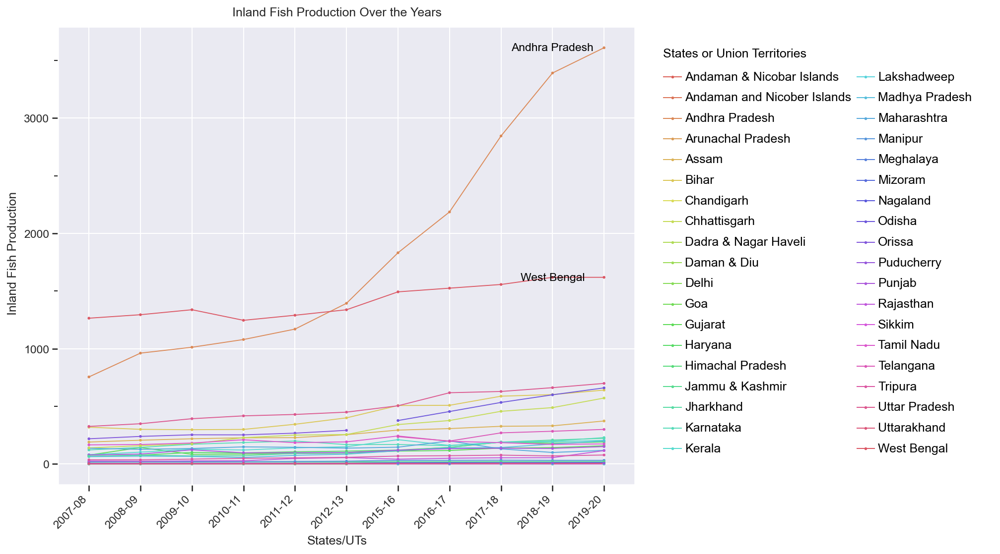

<ggplot: (136777787718)>

In [37]:
df=inland_fish_df.loc[inland_fish_df["States or Union Territories"]!='Total',:]
df_helper=df[df["Year"]=="2019-20"].sort_values(by="Inland_Fish_Production",ascending=False)[:2]
p=(ggplot(df,aes(x="Year",y="Inland_Fish_Production",group="States or Union Territories",color="States or Union Territories"))+
geom_line()+
   geom_point(size=0.5)+
labs(title="Inland Fish Production Over the Years",x="States/UTs",y="Inland Fish Production")+
annotate('text', x='2018-19', y=df_helper["Inland_Fish_Production"].tolist(), label=df_helper["States or Union Territories"].tolist())+
theme_seaborn()+
theme(axis_text_x=element_text(angle=45, hjust=1),dpi=150,figure_size=(10,8)))
p.save("Inland Fish Production Over the Years.png",dpi=300)
p

In [38]:
inland_fish_df.rename(columns={"States or Union Territories":"States_or_Union_Territories"},inplace=True)
df=inland_fish_df.loc[inland_fish_df["States_or_Union_Territories"]!='Total',:]

In [39]:
df=df.groupby("States_or_Union_Territories").sum().reset_index().sort_values(by=["Inland_Fish_Production"],ascending=False)[:15]

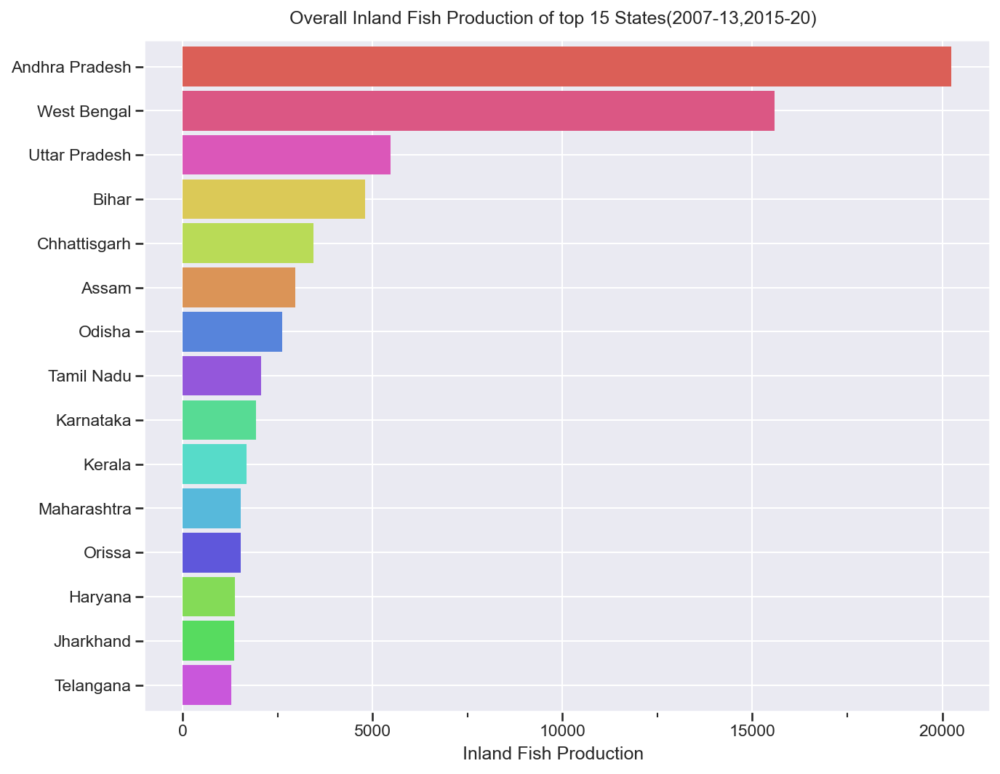

<ggplot: (136778074462)>

In [40]:
p=(ggplot(df,aes(x="reorder(States_or_Union_Territories,Inland_Fish_Production)",y="Inland_Fish_Production",fill="States_or_Union_Territories"))+
 geom_bar(stat='identity')+
 labs(x="",y="Inland Fish Production",title="Overall Inland Fish Production of top 15 States(2007-13,2015-20)")+
 coord_flip()+
   theme_seaborn()+
 theme(legend_position='none',dpi=150,figure_size=(10,8)))
p.save("Overall Inland Fish Production.png",dpi=150)
p

In [41]:
total_fish_df=filter_df('Total',pre_columns,fish_df)
total_fish_df=total_fish_df.melt(id_vars=['States or Union Territories'],var_name='Year',value_name="Total_Fish_Production")
total_fish_df['Year']=total_fish_df['Year'].apply(extract_year)

In [42]:
total_recent_fish_df=inland_recent_fish_df.copy()
total_recent_fish_df["Total_Fish_Production"]=total_recent_fish_df["Inland_Fish_Production"]+marine_recent_fish_df["Marine_Fish_Production"]

In [43]:
total_recent_fish_df.drop(columns=["Inland_Fish_Production"],inplace=True)

In [44]:
total_fish_df=pd.concat([total_fish_df,total_recent_fish_df])

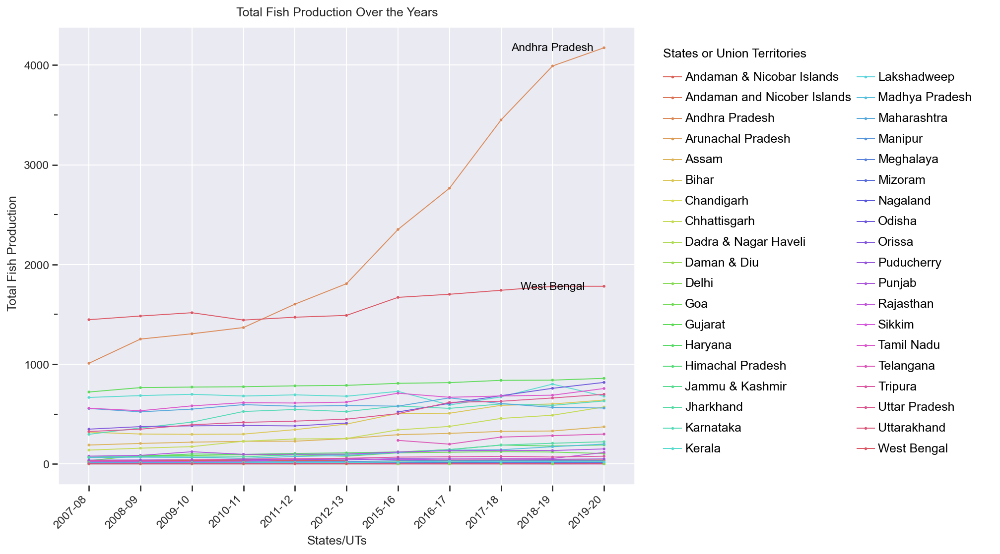

<ggplot: (136778724660)>

In [45]:
df=total_fish_df.loc[total_fish_df["States or Union Territories"]!='Total',:]
df_helper=df[df["Year"]=="2019-20"].sort_values(by="Total_Fish_Production",ascending=False)[:2]
p=(ggplot(df,aes(x="Year",y="Total_Fish_Production",group="States or Union Territories",color="States or Union Territories"))+
geom_line()+
   geom_point(size=0.5)+
labs(title="Total Fish Production Over the Years",x="States/UTs",y="Total Fish Production")+
annotate('text', x='2018-19', y=df_helper["Total_Fish_Production"].tolist(), label=df_helper["States or Union Territories"].tolist())+
theme_seaborn()+
theme(axis_text_x=element_text(angle=45, hjust=1),dpi=150,figure_size=(10,8)))
p.save("Total Fish Production Over the Years.png",dpi=300)
p

In [46]:
total_fish_df.rename(columns={"States or Union Territories":"States_or_Union_Territories"},inplace=True)
df=total_fish_df.loc[total_fish_df["States_or_Union_Territories"]!='Total',:]
df=df.groupby(by="States_or_Union_Territories").sum(numeric_only=True).reset_index().sort_values(by=["Total_Fish_Production"],ascending=False)[:15]

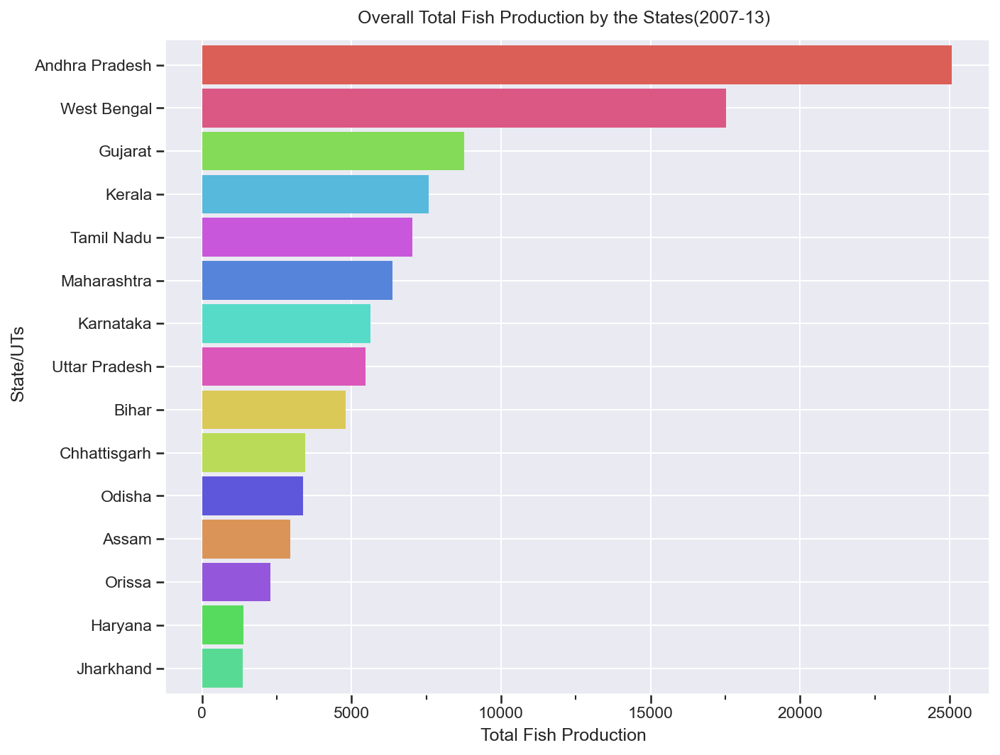

<ggplot: (136782522947)>

In [47]:
p=(ggplot(df,aes(x="reorder(States_or_Union_Territories,Total_Fish_Production)",y="Total_Fish_Production",fill="States_or_Union_Territories"))+
 geom_bar(stat='identity')+
 labs(x="State/UTs",y="Total Fish Production",title="Overall Total Fish Production by the States(2007-13)")+
 coord_flip()+theme_seaborn()+
 theme(legend_position='none',dpi=150,figure_size=(10,8)))
p.save("Overall Total Fish Production.png",dpi=150)
p

In [219]:
df1

,States_or_Union_Territories,Year,Marine_Fish_Production,Type
13,Total,2007-08,2919.50,Marine
27,Total,2008-09,2978.19,Marine
41,Total,2009-10,3103.84,Marine
55,Total,2010-11,3249.46,Marine
69,Total,2011-12,3371.75,Marine
83,Total,2012-13,3320.78,Marine


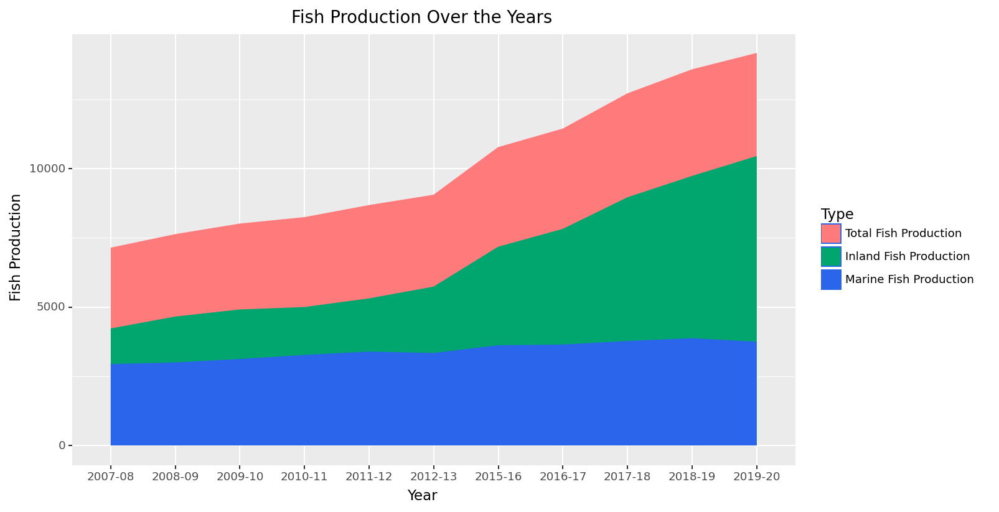

<ggplot: (136788707545)>

In [222]:
df1=marine_df.loc[marine_df['States_or_Union_Territories']=='Total',:].copy()
df1['Type']="Marine"
df2=inland_fish_df.loc[inland_fish_df['States_or_Union_Territories']=='Total',:].copy()
df2['Type']="Inland"
df3=total_fish_df.loc[total_fish_df['States_or_Union_Territories']=='Total',:].copy()
df3['Type']="Total"
p=(ggplot()+
 geom_area(df3,aes(x="Year",y="Total_Fish_Production",group=1,fill="Type"),color="#ff7b7b")+
 geom_area(df2,aes(x="Year",y="Inland_Fish_Production",group=1,fill="Type"),color="#01A66F")+
 geom_area(df1,aes(x="Year",y="Marine_Fish_Production",group=1,fill="Type"),color="#2B65EC")+
 labs(x="Year",y="Fish Production",title="Fish Production Over the Years")+
 theme(dpi=150,figure_size=(10,6))+
 scale_fill_manual(values=["#ff7b7b", "#01A66F", "#2B65EC"], labels=["Total Fish Production", "Inland Fish Production", "Marine Fish Production"]))
p.save("Fish Production.png",dpi=150)
p

## Marine vs Inland Production

In [48]:
data=pd.read_csv(fish_path+"\Fish_Production_over_the_years.csv")

In [49]:
years=["1950-51","1980-81","1985-86","1990-91","1995-96","2000-01","2005-06","2010-11","2015-16","2019-20"]

In [50]:
df=data[data["Year"].isin(years)].copy()

In [51]:
df_production=df.iloc[:,:4]

In [52]:
df["Marine Fish Production(%)"]=df["Marine Fish production(In Lakh Tonnes)"]*100/df["Total Fish production(In Lakh Tonnes)"]
df["Inland Fish Production(%)"]=df["Inland Fish production(In Lakh Tonnes)"]*100/df["Total Fish production(In Lakh Tonnes)"]

In [53]:
df_production=df_production.melt(id_vars=["Year"],var_name="Type",value_name="Production(in Lakh Tonnes)")

In [54]:
df_production.replace("Total Fish production(In Lakh Tonnes)","Total",inplace=True)
df_production.replace("Inland Fish production(In Lakh Tonnes)","Inland",inplace=True)
df_production.replace("Marine Fish production(In Lakh Tonnes)","Marine",inplace=True)

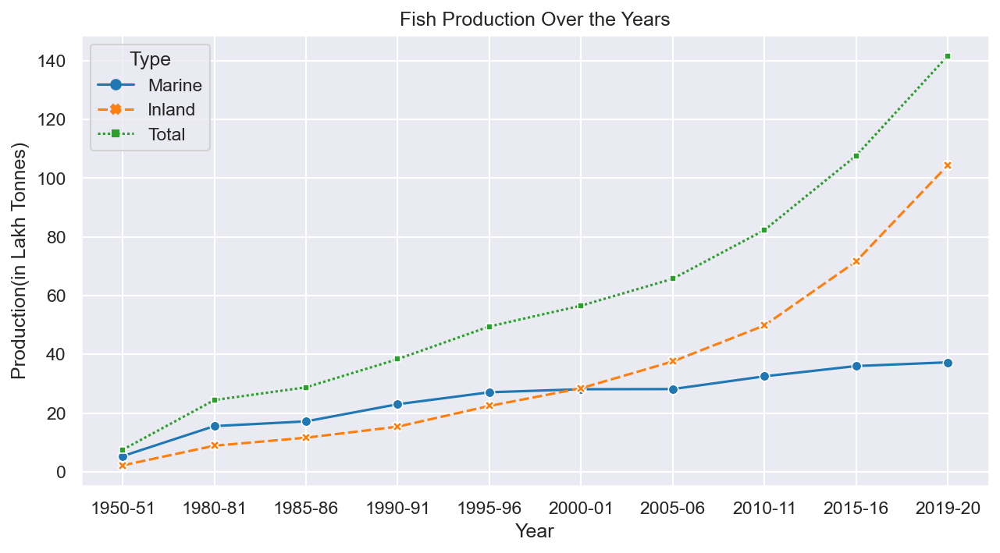

In [55]:
with sns.axes_style("darkgrid"):
    plt.figure(figsize=(10,5))
    sns.lineplot(df_production,x="Year",y="Production(in Lakh Tonnes)",hue="Type",style="Type",markers=True)
    plt.title("Fish Production Over the Years")
plt.savefig("Fish Production over the years.png",dpi=200)
plt.show()

In [56]:
df=df.iloc[:,[0,7,8]].copy()

In [57]:
df["Label"]=[["Marine","Inland"]]*10

In [58]:
df["Production(%)"]=list(np.array([df["Marine Fish Production(%)"],df["Inland Fish Production(%)"]]).T)

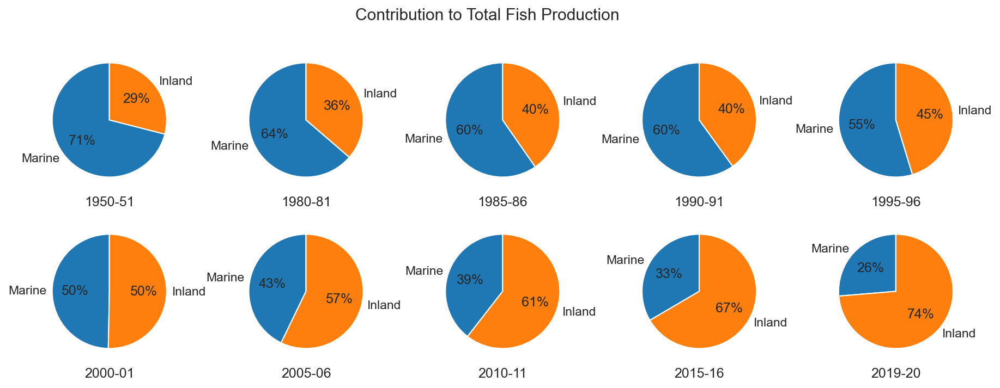

In [59]:
df.reset_index(inplace=True)

fig,axes=plt.subplots(2,5,figsize=(15,5))
for i in range(2):
    for j in range(5):
        axes[i,j].pie(df["Production(%)"][5*i+j],labels=df['Label'][5*i+j],autopct='%.0f%%',startangle = 90)
        axes[i,j].set_xlabel(df["Year"][5*i+j])
plt.suptitle("Contribution to Total Fish Production")
plt.savefig("Contribution to total fish production.png",dpi=200)
plt.show()

## Fish Consumption

In [60]:
fc=pd.read_csv(fish_path+"\FIsh_Consumption_2019_20.csv")

In [61]:
fc.dropna(inplace=True)

In [62]:
fc.rename(columns={"States/Uts":"States_UTs","Yearly Fish Consumption(Per Capita/Kg.)2019-20":"Yearly_Fish_Consumption"},inplace=True)

In [63]:
fc=fc.sort_values(by="Yearly_Fish_Consumption",ascending=False)[:10]

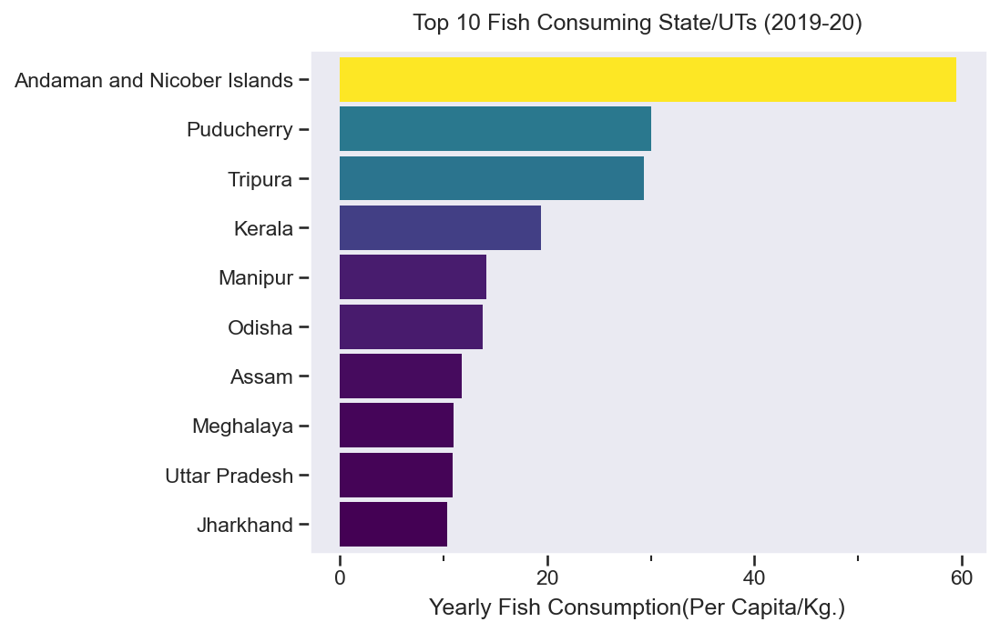

<ggplot: (136787153649)>

In [64]:
p=(ggplot(fc,aes(x="reorder(States_UTs,Yearly_Fish_Consumption)",y="Yearly_Fish_Consumption",fill="Yearly_Fish_Consumption"))+
geom_bar(stat="identity")+coord_flip()+
labs(x="",y="Yearly Fish Consumption(Per Capita/Kg.)",title="Top 10 Fish Consuming State/UTs (2019-20)")+
theme_seaborn()+
 theme(legend_position='none',panel_grid=element_blank(),dpi=150))
p.save("FishConsumption.png",dpi=200)
p

## Fish Export

In [65]:
fe=pd.read_csv(fish_path+"\Fish_Export.csv")

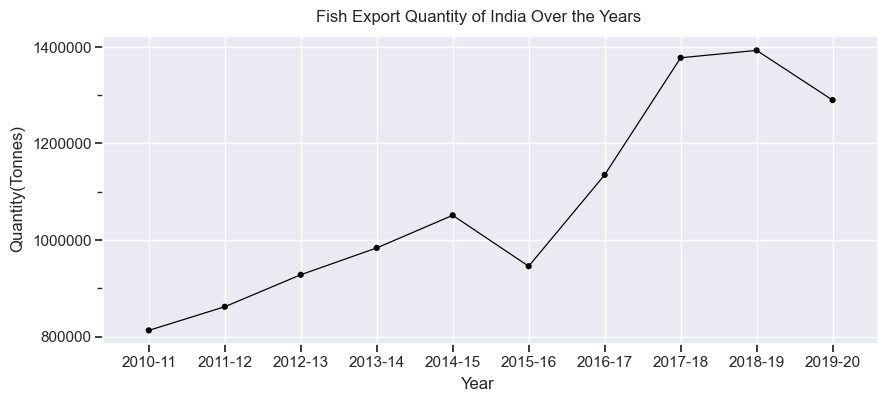

<ggplot: (136787160046)>

In [66]:
p=(ggplot(fe,aes(x="Year",y="Quantity(Tonnes)",group=1))+
geom_line()+
geom_point()+
theme_seaborn()+
theme(figure_size=(10, 4))+
labs(title="Fish Export Quantity of India Over the Years"))
p.save("fish_export_qty.png",dpi=200)
p

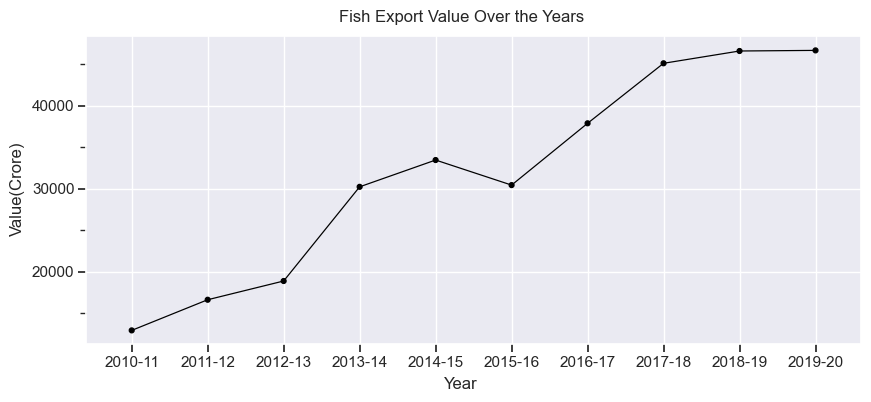

<ggplot: (136787243918)>

In [67]:
p=(ggplot(fe,aes(x="Year",y="Value(Crore)",group=1))+
geom_line()+
geom_point()+
theme_seaborn()+
theme(figure_size=(10, 4))+
labs(title="Fish Export Value Over the Years"))
p.save("fish_export_value.png",dpi=200)
p

## Fishermen Population

In [68]:
fp=pd.read_csv(fish_path+"\Fisherman_Population.csv")

In [69]:
fp=fp.melt(id_vars=['Type'],var_name='Sex',value_name="Population")

In [70]:
fp["Population"]=fp["Population"]/1000000

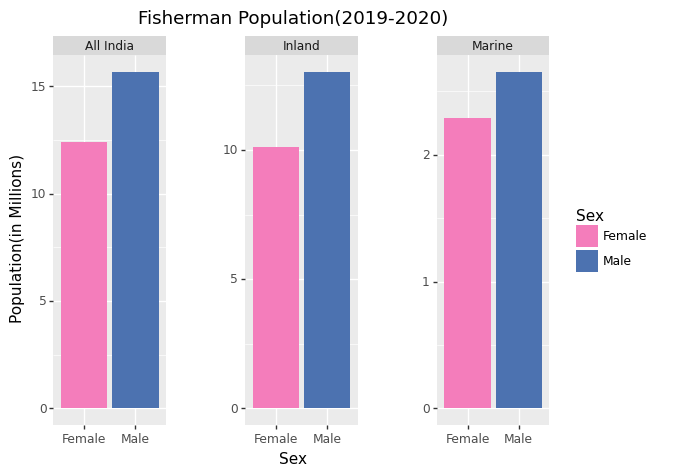

<ggplot: (136791828146)>

In [71]:
p=(ggplot(fp[fp["Sex"]!="Total"],aes(x="Sex",y="Population",fill="Sex"))+geom_bar(stat="identity",position="dodge")+facet_wrap("Type",scales="free_y")+
theme(subplots_adjust={'wspace': 0.7})+
 scale_fill_manual(values=['#f47dbb','#4c72b0'],labels=["Female","Male"],name="Sex")+
labs(title="Fisherman Population(2019-2020)",y="Population(in Millions)"))
p.save("Fisherman Population.png",dpi=200)
p

##  India's contribution

In [72]:
world=pd.read_csv(fish_path+"\India_world_contribution_Fish.csv")

In [73]:
df=world.iloc[:,:4].copy()
df=df.melt(id_vars=["Year"],var_name="Type",value_name="Production(in MMT)")

In [74]:
df=df[df["Type"]!="Total World production(In MMT)"]

In [75]:
labels=df["Production(in MMT)"].values
labels
y_position=[50,50,50,125,135,145]
x_pos=[2016,2017,2018,2016,2017,2018]

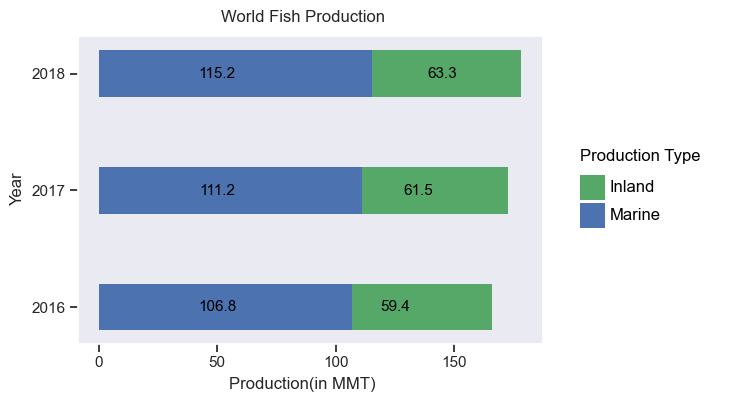

<ggplot: (136778709053)>

In [76]:
p=(ggplot(df,aes(x="Year",y="Production(in MMT)",fill="Type"))+
geom_col(width=0.4)+
 scale_fill_manual(values=['#55a868','#4c72b0'],labels=["Inland","Marine"],name="Production Type")+
 scale_x_continuous(breaks=range(2016,2019,1),minor_breaks=None)+
 scale_y_continuous(minor_breaks=None)+
coord_flip()+theme_seaborn()+
theme(panel_grid=element_blank(),figure_size=(6,4))+
labs(title="World Fish Production")+
annotate('text', x=x_pos, y=y_position, label=labels))
p.save("WorldFishProd.png",dpi=200)
p

In [77]:
df=world.iloc[:,[0,4,5,6]]
df=df.melt(id_vars=["Year"],var_name="Type",value_name="Contribution(in MMT)")
df=df[df["Type"]!="Total Contribution of India(In MMT)"]

In [78]:
labels=df["Contribution(in MMT)"].values
labels
y_position=[2,2,2,6,7,8]
x_pos=[2016,2017,2018,2016,2017,2018]

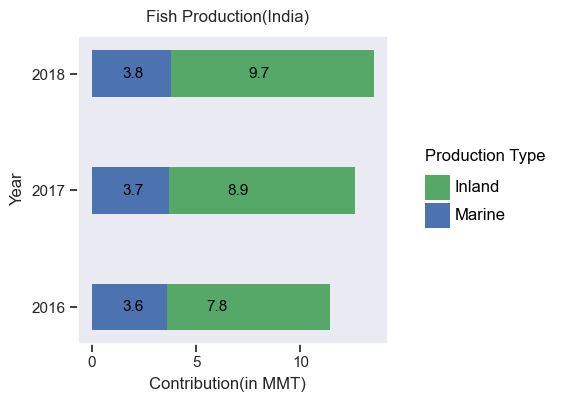

<ggplot: (136792556632)>

In [79]:
p=(ggplot(df,aes(x="Year",y="Contribution(in MMT)",fill="Type"))+
geom_col(width=0.4)+
 scale_fill_manual(values=['#55a868','#4c72b0'],labels=["Inland","Marine"],name="Production Type")+
 scale_x_continuous(breaks=range(2016,2019,1),minor_breaks=None)+
 scale_y_continuous(minor_breaks=None)+
coord_flip()+theme_seaborn()+
theme(panel_grid=element_blank(),figure_size=(4,4))+
labs(title="Fish Production(India)")+annotate('text', x=x_pos, y=y_position, label=labels))
p.save("IndiaFish.png",dpi=200)
p

In [80]:
world["Marine Contribution(%)"]=world["Marine Contribution of India(In MMT)"]*100/world["Marine World production(In MMT)"]
world["Inland Contribution(%)"]=world["Inland Contribution of India(In MMT)"]*100/world["Inland World production(In MMT)"]
world["Total Contribution(%)"]=world["Total Contribution of India(In MMT)"]*100/world["Total World production(In MMT)"]

In [81]:
df=world.iloc[:,[0,7,8,9]].copy()

In [82]:
df=df.melt(id_vars=["Year"],var_name="Type",value_name="Contribution(%)")

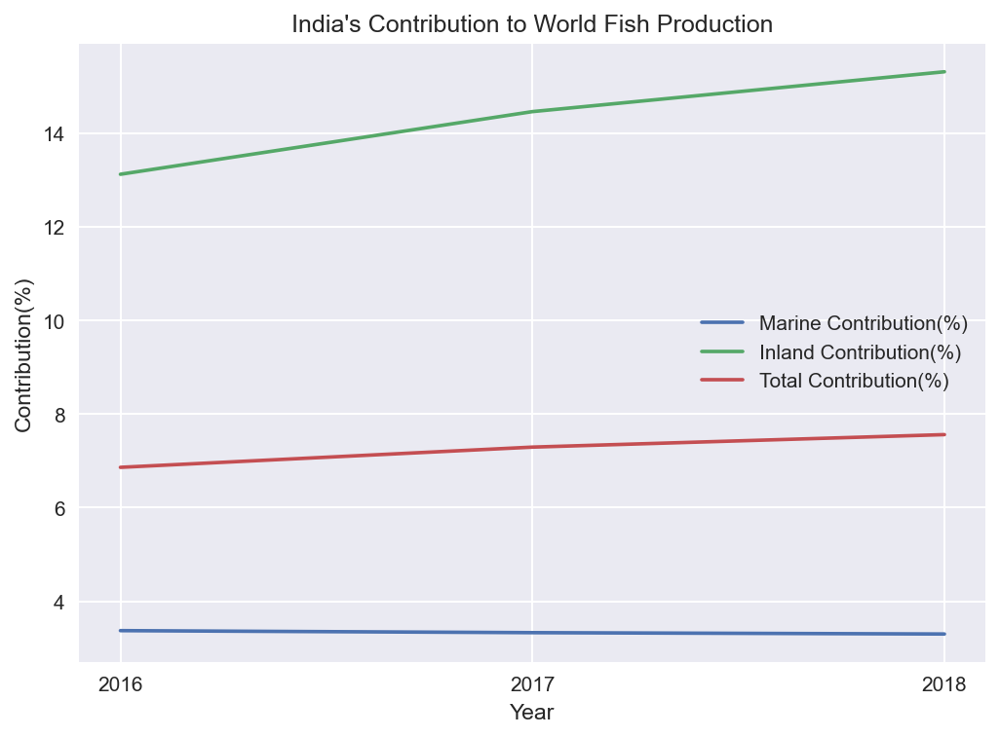

In [83]:
plt.style.use('seaborn-v0_8')
sns.lineplot(df,x="Year",y="Contribution(%)",hue="Type")
plt.xticks([2016,2017,2018])
plt.legend()
# plt.yticks(range(1,17,2))
plt.title("India's Contribution to World Fish Production")
plt.savefig("IndiaWorldFishContr.png",dpi=200)
p
plt.show()


# Horticulture

In [84]:
hort_path=path+"\Agriculture\Horticulture"
os.chdir(hort_path)

In [85]:
horticulture_df=pd.read_csv("Horticulture.csv")

## Data Cleaning

In [86]:
horticulture_df

,Category,State/ UT Name,Brinjal-Area-2009-10,Brinjal-Production-2009-10,Brinjal-Area-2010-11,Brinjal-Production-2010-11,Brinjal-Area-2011-12,Brinjal-Production-2011-12,Brinjal-Area-2012-13,Brinjal-Production-2012-13,...,Total-Area-2010-11,Total-Production-2010-11,Total-Area-2011-12,Total-Production-2011-12,Total-Area-2012-13,Total-Production-2012-13,Total-Area-2013-14,Total-Production-2013-14,Total-Area-2014-15 @,Total-Production-2014-15 @
0,State,Andhra Pradesh,24.3,485.0,NaN,NaN,76.3,1524.9,80.8,1615.3,...,0.0,0.0,661.0,98.4,686.1,12104.7,439.6,8149.8,354.9,6445.6
1,State,Arunachal Pradesh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,6.3,40.0,1.5,37.6,1.4,35.0,1.7,41.0
2,State,Assam,15.9,253.0,NaN,NaN,16.5,260.1,16.8,267.9,...,0.0,0.0,266.0,783.4,278.7,3415.1,281.4,3031.9,296.2,4752.1
3,State,Bihar,55.3,1198.6,NaN,NaN,56.1,1271.5,56.2,1291.5,...,0.0,0.0,857.0,6101.7,861.8,16325.7,809.8,15097.8,842.0,14467.2
4,State,Chhattisgarh,25.2,374.5,26.7,439.5,28.5,502.9,31.2,545.7,...,190.0,2717.1,351.6,579.2,380.7,4993.9,403.4,5465.9,418.6,5739.5
5,State,Goa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,6.5,0.0,6.7,80.5,7.0,79.9,7.2,82.0
6,State,Gujarat,65.8,1143.6,72.0,1236.3,73.1,1270.6,76.8,1341.1,...,341.9,7144.1,517.6,2395.5,537.6,10520.7,582.3,11571.2,578.4,11543.3
7,State,Haryana,13.0,143.2,14.6,255.2,17.8,281.5,18.3,302.9,...,165.8,2718.3,356.8,618.9,360.3,5011.3,373.2,5565.9,368.4,5291.5
8,State,Himachal Pradesh,1.1,20.5,1.0,25.1,1.1,25.6,1.1,23.5,...,61.1,1144.1,85.7,206.2,79.5,1521.1,86.6,1635.9,83.7,1585.4
9,State,Jammu & Kashmir,2.5,40.6,2.6,45.3,2.0,45.2,2.0,45.2,...,39.3,886.4,63.1,127.2,63.1,1395.5,63.1,1395.5,63.1,1395.5


In [87]:
def filter_df(word,pre_columns,df):
    '''
    Return subset of dataframe with only columns containing the given word
    '''
    cols=pre_columns+df.filter(like=word).columns.tolist()
    return df[cols].copy()

In [88]:
pre_columns=['Category', 'State/ UT Name']

In [89]:
vegetable_list=["Brinjal","Cabbage","C.Flower","Okra","Peas","Tomato","Onion","Potato","Sweet Potato","Tapioca","Others","Total"]

In [90]:
def extract_year(string):
    '''
    helper function to extract year from,say, Brinjal-Area-2009-10
    '''
    string=string.replace(' @','')
    l=string.split('-')
    return '-'.join(l[2:])

In [91]:
def convert_to_long(df,vegetable,pre_columns):
    '''
    Used to convert the wide to long format.
    Pre_columns are the columns which will not be affected in the conversion
    '''
    df=filter_df(vegetable,pre_columns,df)
    df1=df.melt(id_vars=['Category',	'State/ UT Name'],value_vars=[vegetable+'-Area-2009-10',
       vegetable+'-Area-2010-11',
       vegetable+'-Area-2011-12',
       vegetable+'-Area-2012-13',
       vegetable+'-Area-2013-14',
       vegetable+'-Area-2014-15 @'],var_name="Year",value_name="Area")
    df1['Year']=df1['Year'].apply(extract_year)
    df1['Vegetable']=vegetable
    df2=df.melt(id_vars=['Category',	'State/ UT Name'],value_vars=[vegetable+'-Production-2009-10',
       vegetable+'-Production-2010-11',
       vegetable+'-Production-2011-12',
       vegetable+'-Production-2012-13',
       vegetable+'-Production-2013-14',
       vegetable+'-Production-2014-15 @'],var_name="Year",value_name="Production")
    df2['Year']=df2['Year'].apply(extract_year)
    return pd.concat([df1,df2['Production']],axis=1)

In [92]:
hort_df=convert_to_long(horticulture_df,'Brinjal',pre_columns)
for i in range(1,len(vegetable_list)):
    hort_df=pd.concat([hort_df,convert_to_long(horticulture_df,vegetable_list[i],pre_columns)])

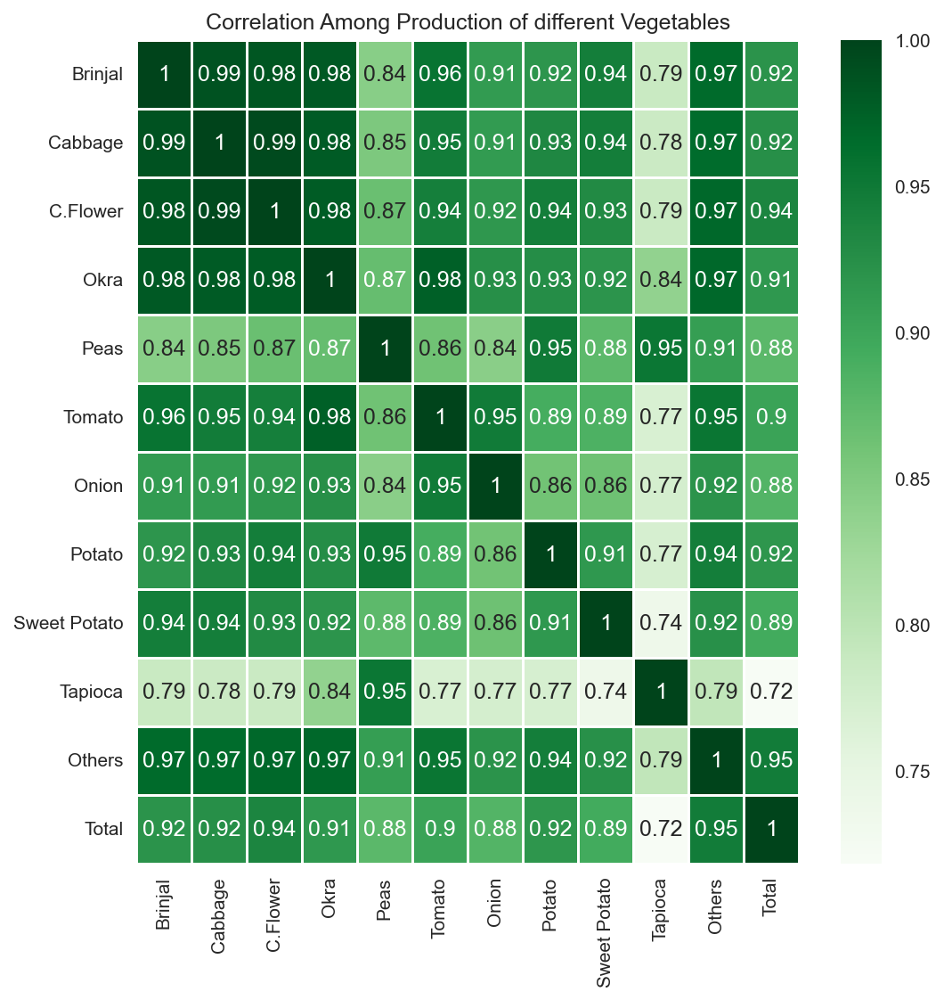

In [93]:
production={}
for i in vegetable_list:
    production[i]=hort_df[hort_df["Vegetable"]==i]["Production"].values
production=pd.DataFrame(production)
plt.figure(figsize=(8,8))
sns.heatmap(production.corr(),cmap="Greens",annot=True, linewidth=.5)
plt.title("Correlation Among Production of different Vegetables")
plt.savefig("correlation.png",dpi=200,bbox_inches='tight')
plt.show()

In [94]:
hort_df.dropna(inplace=True)

In [95]:
hort_df=hort_df.reset_index().drop(columns=["index"])
hort_df.rename(columns={"State/ UT Name":"State_UT_Name"},inplace=True)

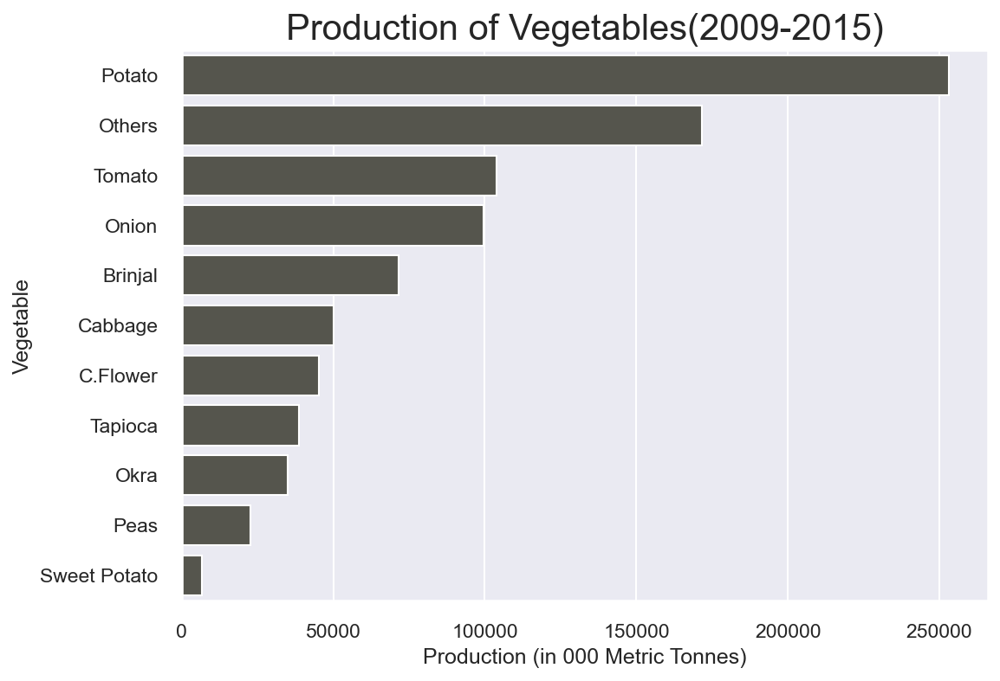

In [96]:
df=hort_df[(hort_df["State_UT_Name"]=="Total") & (~hort_df["Vegetable"].isin(["Total"]))]
df=df.groupby(by="Vegetable").sum().reset_index().sort_values(by="Production",ascending=False)
sns.set_theme()
ax=sns.barplot(df,x="Production",y="Vegetable",color="#56564C")
ax.set_xlabel("Production (in 000 Metric Tonnes)")
ax.set_title("Production of Vegetables(2009-2015)",size=20)
plt.savefig("Production of Vegetables.png",dpi=200)
plt.show()

In [97]:
df=hort_df.groupby(by=["Vegetable","Year"]).mean().reset_index()

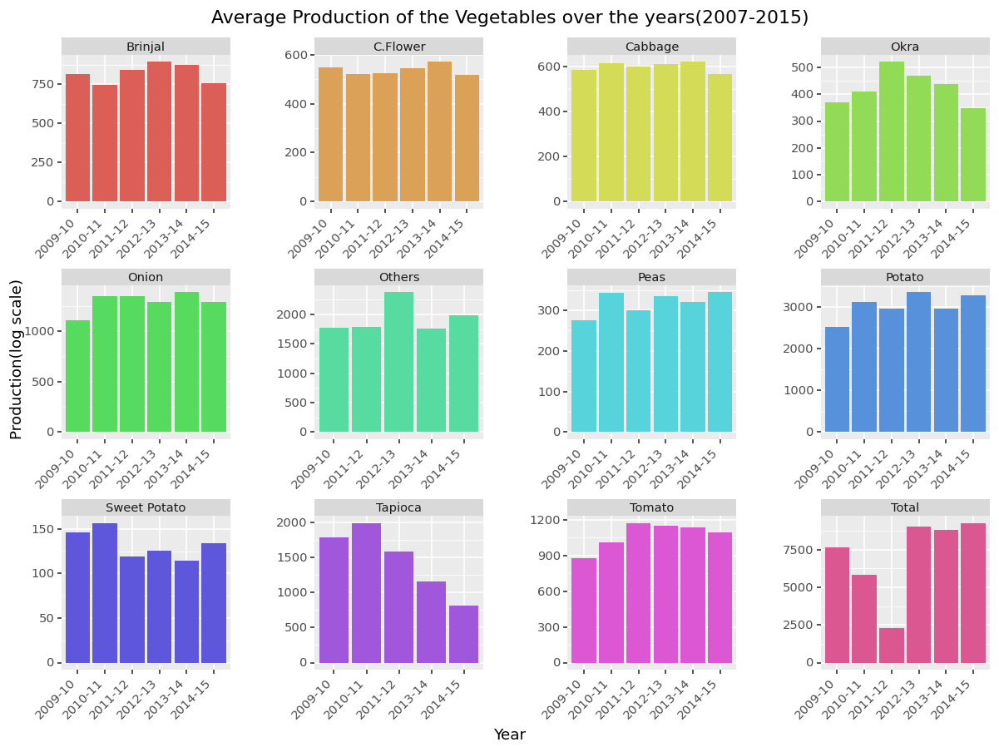

<ggplot: (136795841012)>

In [98]:
p=(ggplot(df,aes(x="Year",y="Production",fill="Vegetable"))+
geom_bar(stat='identity',position=position_dodge()) +
facet_wrap("Vegetable",scales="free",nrow=3)+
 theme(axis_text_x = element_text(angle = 45,hjust=1))+
 theme(legend_position='none',subplots_adjust={'hspace': 0.5,'wspace':0.5},dpi=120,figure_size=(12, 8))+
  labs(y="Production(log scale)",title="Average Production of the Vegetables over the years(2007-2015)"))
p.save("Average Production of the Vegetables over the years.png",dpi=120)
p

In [99]:
df=hort_df[hort_df['State_UT_Name']!='Total'].groupby(["Category","State_UT_Name","Vegetable"]).mean().reset_index()

In [100]:
df=df[df["Category"]=="State"].groupby("State_UT_Name").mean().reset_index()

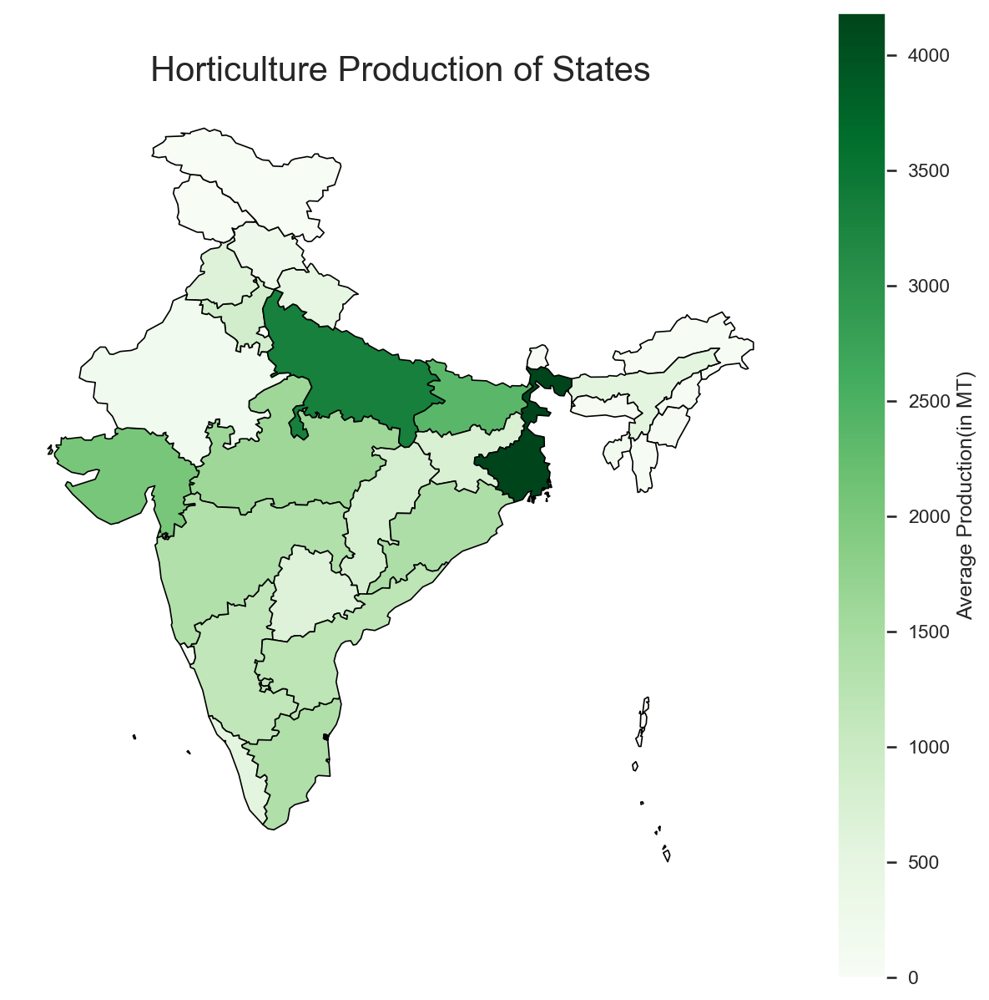

In [101]:
#Merging the data
merged = map_df.set_index('st_nm').join(df.set_index('State_UT_Name'))
merged['Production'] = merged['Production'].replace(np.nan, 0)
merged.head()
#Create figure and axes for Matplotlib and set the title
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.axis('off')
ax.set_title('Horticulture Production of States', fontdict={'fontsize': '20', 'fontweight' : '10'})
# Plot the figure
merged.plot(column='Production',cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0',legend=True,markersize=[39.739192, -104.990337], legend_kwds={'label': "Average Production(in MT)"})
plt.savefig("Horticulture Production of States.png",dpi=200,bbox_inches="tight")
plt.show()

## Horticulture over the years

In [102]:
hoty=pd.read_csv("Horticulture_over_the_years.csv")

In [103]:
hoty.columns

Index(['Year', 'Fruits A', 'Fruits P', 'Fruits Pdy.', 'Vegetables A',
       'Vegetables P', 'Vegetables Pdy.', 'Flowers Aromatic & Medicinal A',
       'Flowers Aromatic & Medicinal P', 'Flowers Aromatic & Medicinal Pdy.',
       'Plantation Crops A', 'Plantation Crops P', 'Plantation Crops Pdy.',
       'Spices A', 'Species P', 'Species Pdy.', 'Total A', ' Total P',
       'Total Pdy.'],
      dtype='object')

In [104]:
hoty_melt=hoty.melt(id_vars=['Year'],var_name="Type",value_name="Value")

In [105]:
hoty_melt["Area/Production"]=hoty_melt["Type"].apply(lambda x : x.split()[-1])

In [106]:
hoty_melt["Type"]=hoty_melt["Type"].apply(lambda x : ' '.join(x.split()[:-1]))

In [107]:
hoty_melt.replace("A","Area(in 000 Ha)",inplace=True)
hoty_melt.replace("P","Production(in 000 MT)",inplace=True)
hoty_melt.replace("Pdy.","Productivity(MT/Ha)",inplace=True)

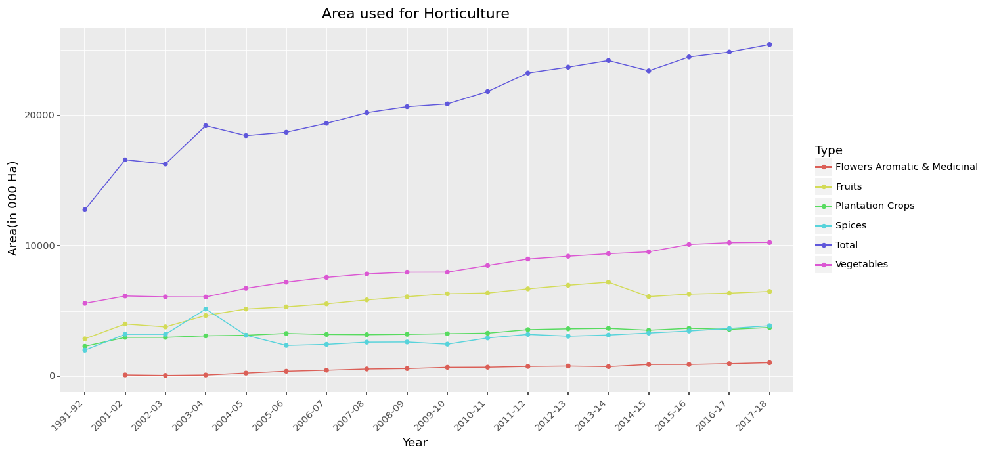

<ggplot: (136778789639)>

In [108]:
df=hoty_melt[hoty_melt["Area/Production"]=="Area(in 000 Ha)"]
p=(ggplot(df,aes(x="Year",y="Value",group="Type",color="Type"))+geom_line()+geom_point()+
 theme(axis_text_x = element_text(angle = 45,hjust=1))+
 # scale_color_manual(values=['#960018','#4c72b0'],labels=["Horticulture","Foodgrains"],name="Production")+
theme(subplots_adjust={'hspace': 0.5,'wspace':0.5},dpi=120,figure_size=(12, 6))+
labs(title="Area used for Horticulture",y="Area(in 000 Ha)"))
p.save("Area used for Horticulture.png",dpi=200)
p

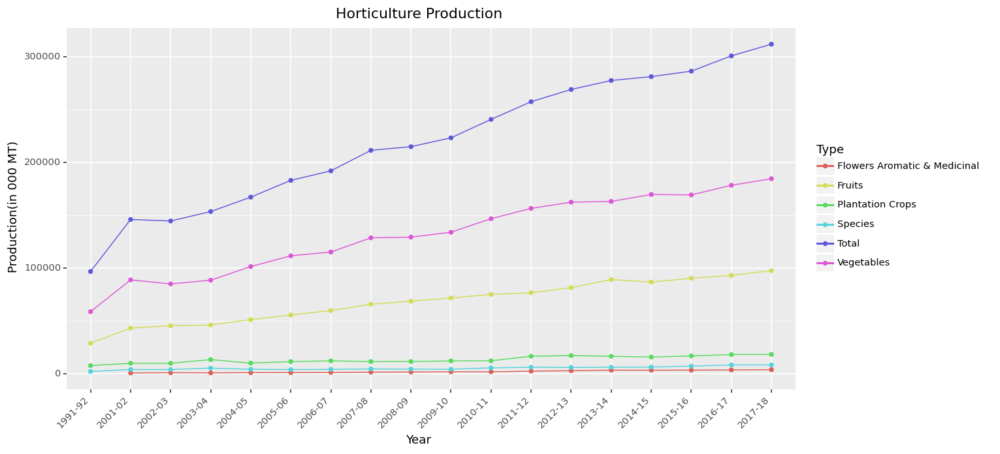

<ggplot: (136777768307)>

In [109]:
df=hoty_melt[hoty_melt["Area/Production"]=="Production(in 000 MT)"]
p=(ggplot(df,aes(x="Year",y="Value",group="Type",color="Type"))+geom_line()+geom_point()+
 theme(axis_text_x = element_text(angle = 45,hjust=1))+
 # scale_color_manual(values=['#960018','#4c72b0'],labels=["Horticulture","Foodgrains"],name="Production")+
theme(subplots_adjust={'hspace': 0.5,'wspace':0.5},dpi=120,figure_size=(12, 6))+
labs(title="Horticulture Production",y="Production(in 000 MT)"))
p.save("Production Horticulture.png",dpi=200)
p

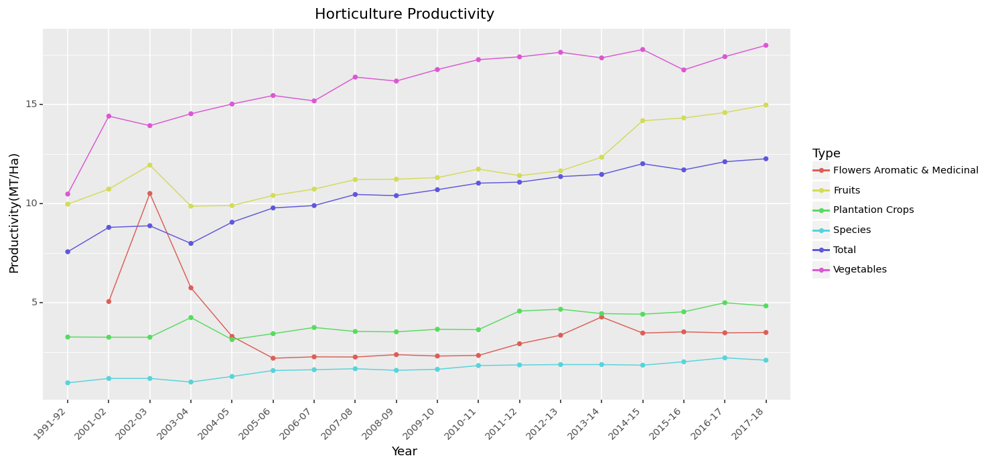

<ggplot: (136777812188)>

In [110]:
df=hoty_melt[hoty_melt["Area/Production"]=="Productivity(MT/Ha)"]
p=(ggplot(df,aes(x="Year",y="Value",group="Type",color="Type"))+geom_line()+geom_point()+
 theme(axis_text_x = element_text(angle = 45,hjust=1))+
 # scale_color_manual(values=['#960018','#4c72b0'],labels=["Horticulture","Foodgrains"],name="Production")+
theme(subplots_adjust={'hspace': 0.5,'wspace':0.5},dpi=120,figure_size=(12, 6))+
labs(title="Horticulture Productivity",y="Productivity(MT/Ha)"))
p.save("Productivity Horticulture.png",dpi=200)
p

## Horticulture vs Foodgrains

In [111]:
hcfg=pd.read_csv("HorticultureVsFoodGrain.csv")

In [112]:
def second_word(sentence):
    return sentence.split()[1]

In [113]:
hcfg=hcfg.melt(id_vars=["Year"],var_name="Type",value_name="Total Production(in Million Tonnes)")

In [114]:
hcfg["Type"]=hcfg["Type"].apply(second_word)

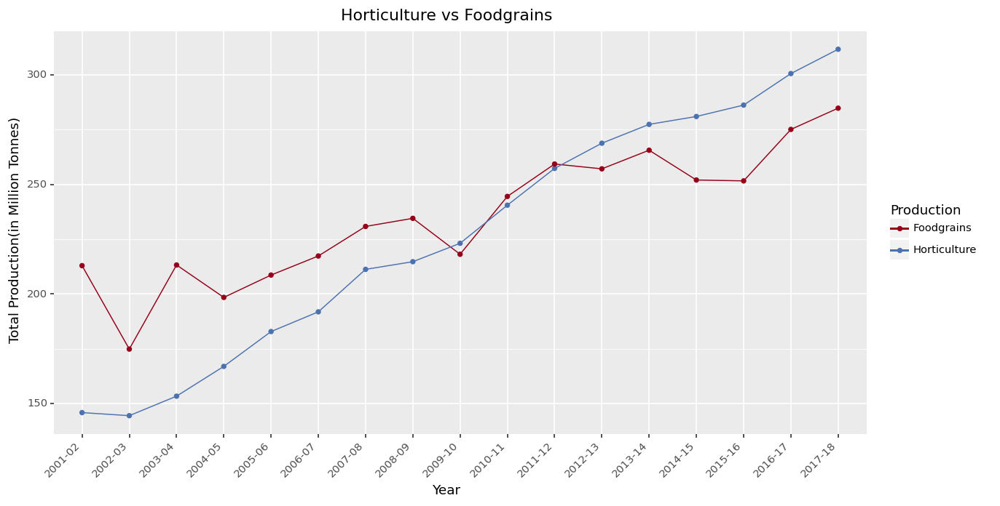

<ggplot: (136773493577)>

In [115]:
p=(ggplot(hcfg,aes(x="Year",y="Total Production(in Million Tonnes)",group="Type",color="Type"))+
 geom_line()+
geom_point()+
 theme(axis_text_x = element_text(angle = 45,hjust=1))+
 scale_color_manual(values=['#960018','#4c72b0'],labels=["Foodgrains","Horticulture"],name="Production")+
theme(subplots_adjust={'hspace': 0.5,'wspace':0.5},dpi=120,figure_size=(12, 6))+
labs(title="Horticulture vs Foodgrains"))
p.save("Horticulture vs Foodgrains.png",dpi=200)
p

## Horticulture in recent years

In [116]:
hc18=pd.read_csv("Horticulture2018-19.csv")
hc19=pd.read_csv("Horticulture2019-20.csv")
hc20=pd.read_csv("Horticulture2020-21.csv")

In [117]:
hc18["Year"]="2018-19"
hc19["Year"]="2019-20"
hc20["Year"]="2020-21"

In [118]:
hcr=pd.concat([hc18,hc19,hc20])

In [119]:
hcr.reset_index(inplace=True)

In [120]:
df=hcr[hcr["STATES/UTs "]!="All India Total"]

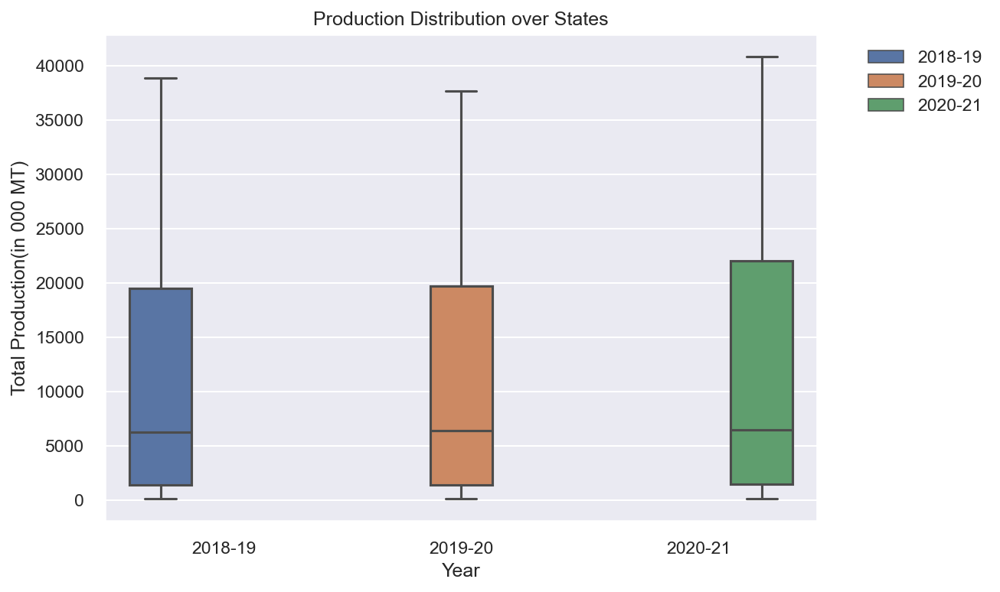

In [121]:
sns.boxplot(df, x="Year", y="TOTAL P",hue="Year")
plt.title("Production Distribution over States")
plt.ylabel("Total Production(in 000 MT)")
plt.legend(handles=plt.gca().get_legend_handles_labels()[0][:3],bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.savefig("Distribution State-wise.png",dpi=200,bbox_inches="tight")
plt.show()

In [122]:
hcr.drop(columns=["Sl. No."],inplace=True)
hcr=hcr.melt(id_vars=["STATES/UTs ","Year"],var_name="Type",value_name="value")

In [123]:
hcr.rename(columns={"STATES/UTs ":"STATES_UTs"},inplace=True)

In [124]:
hcr["Area/Production"]=hcr["Type"].apply(lambda x : x.split()[-1])

hcr["Type"]=hcr["Type"].apply(lambda x : x.split()[0])

hcr.replace("A","Area (in 000 Ha)",inplace=True)
hcr.replace("P","Production (in 000 MT)",inplace=True)

In [125]:
df=hcr[hcr["STATES_UTs"]!="All India Total"]
df=df[df["Type"]!="TOTAL"]
df=df[df["Area/Production"]=="Production (in 000 MT)"]
df["value"]=df["value"].replace(" ",0)
df["value"]=df["value"].replace("",0)
df["value"]=df["value"].astype("float32")
df.dropna(inplace=True)

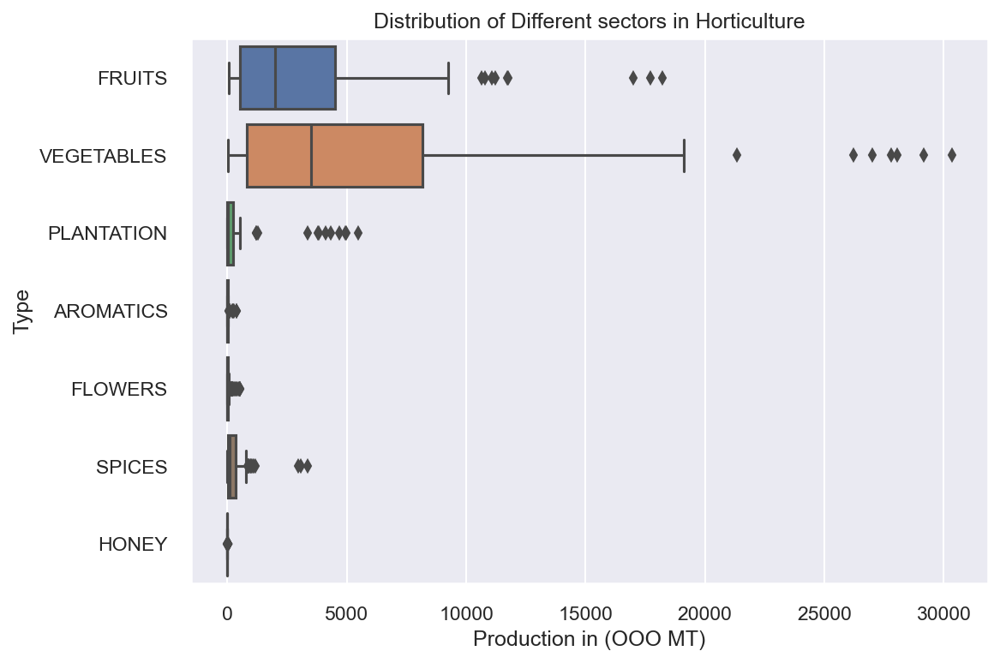

In [126]:
sns.boxplot(df,y="Type",x="value")
plt.title("Distribution of Different sectors in Horticulture")
plt.xlabel("Production in (OOO MT)")
plt.savefig("DistribuitoHort.png",dpi=300,bbox_inches="tight")
plt.show()

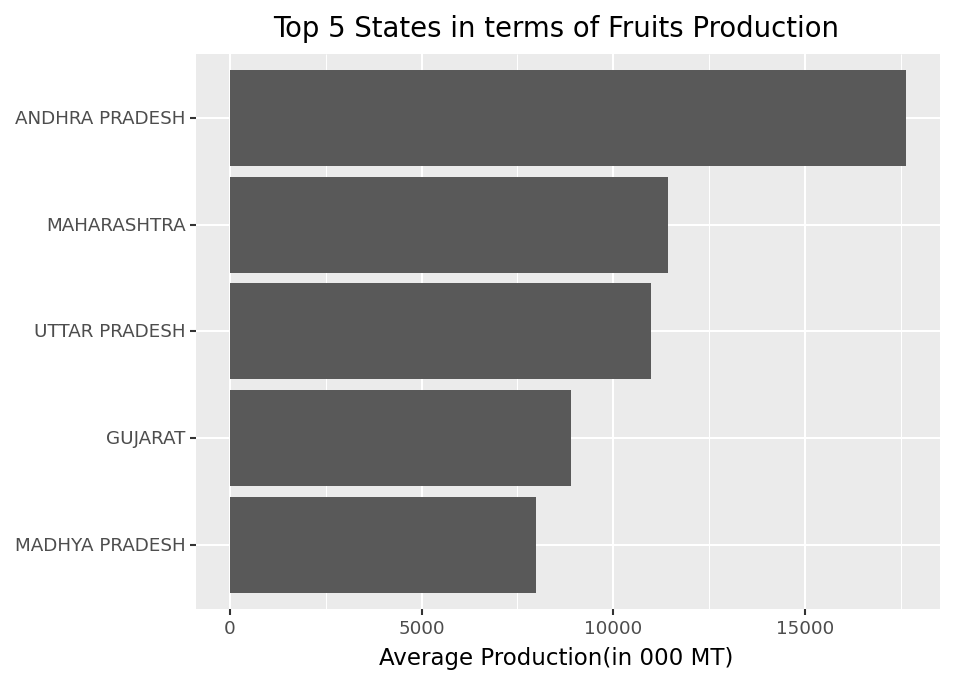

<ggplot: (136778847016)>

In [127]:
fdf=df[df["Type"]=="FRUITS"]
fdf=fdf.groupby(by="STATES_UTs").mean().sort_values(by="value",ascending=False)[:5].reset_index()
p=(ggplot(fdf,aes(x="reorder(STATES_UTs,value)",y="value"))+
   geom_bar(stat="identity")+
   labs(y="Average Production(in 000 MT)",x="",title="Top 5 States in terms of Fruits Production")+
   coord_flip()+
  theme(dpi=150))
p.save("TopFruit.png",dpi=300)
p

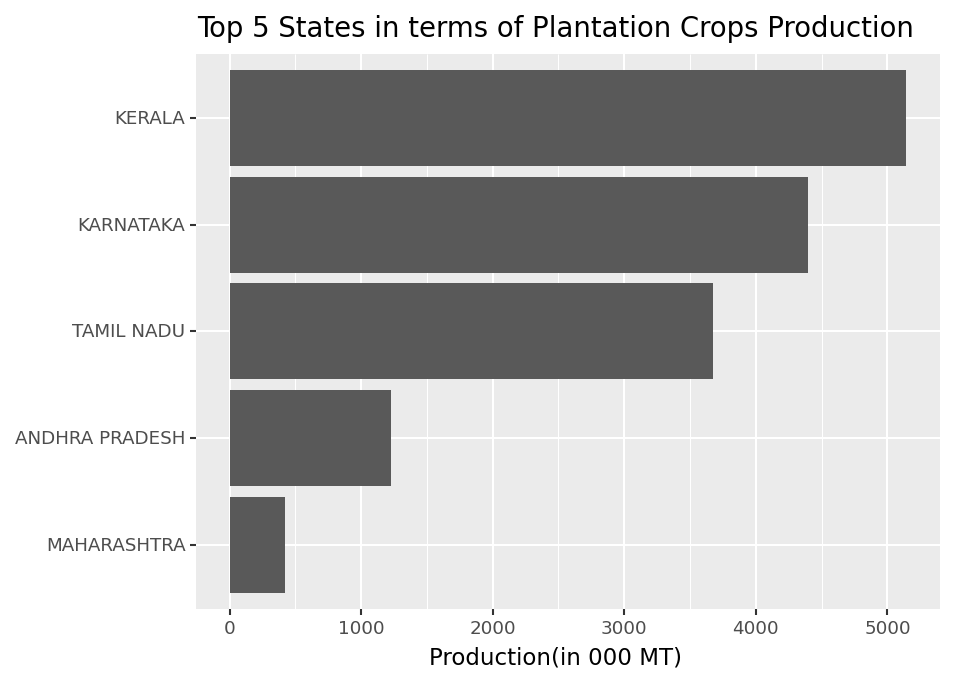

<ggplot: (136778847157)>

In [128]:
fdf=df[df["Type"]=="PLANTATION"]
fdf=fdf.groupby(by="STATES_UTs").mean().sort_values(by="value",ascending=False)[:5].reset_index()
p=(ggplot(fdf,aes(x="reorder(STATES_UTs,value)",y="value"))+
   geom_bar(stat="identity")+
   labs(y="Production(in 000 MT)",x="",title="Top 5 States in terms of Plantation Crops Production")+
   coord_flip()+
  theme(dpi=150))
p.save("TopPlant.png",dpi=300)
p

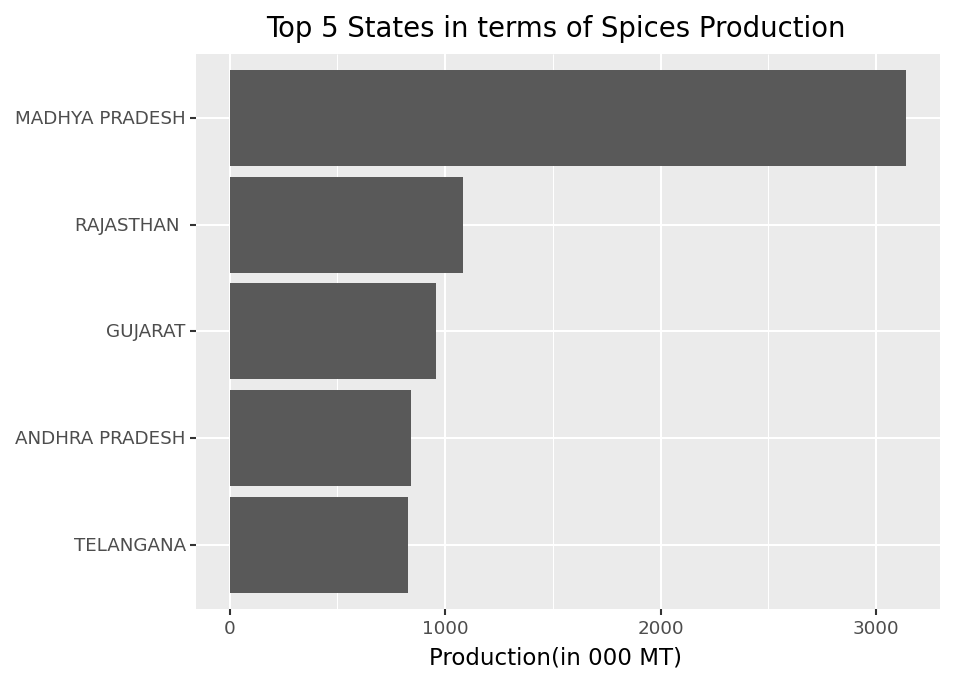

<ggplot: (136777878956)>

In [129]:
fdf=df[df["Type"]=="SPICES"]
fdf=fdf.groupby(by="STATES_UTs").mean().sort_values(by="value",ascending=False)[:5].reset_index()
p=(ggplot(fdf,aes(x="reorder(STATES_UTs,value)",y="value"))+
   geom_bar(stat="identity")+
   labs(y="Production(in 000 MT)",x="",title="Top 5 States in terms of Spices Production")+
   coord_flip()+
  theme(dpi=150))
p.save("TopSpice.png",dpi=300)
p

## STATES

In [130]:
def plot_state_production(state_name):
    '''
    returns Bar plot of top producing crops for the given state. 
    '''
    state_df=hort_df[hort_df["State_UT_Name"]==state_name]
    state_df=state_df[state_df["Vegetable"]!="Total"]
    df=state_df.groupby(by="Year").mean()
    df=state_df.groupby(by="Vegetable").mean().reset_index()
    p=(ggplot(df,aes(x="reorder(Vegetable,Production)",y="Production"))+geom_bar(stat="identity")+
       labs(x="Vegetable",y="Production(in 000 MT)",title=f"Average Production in {state_name}")+coord_flip()+
      theme(dpi=130))
    p.save(f"StateProd {state_name}.png",dpi=130)
    print(p)

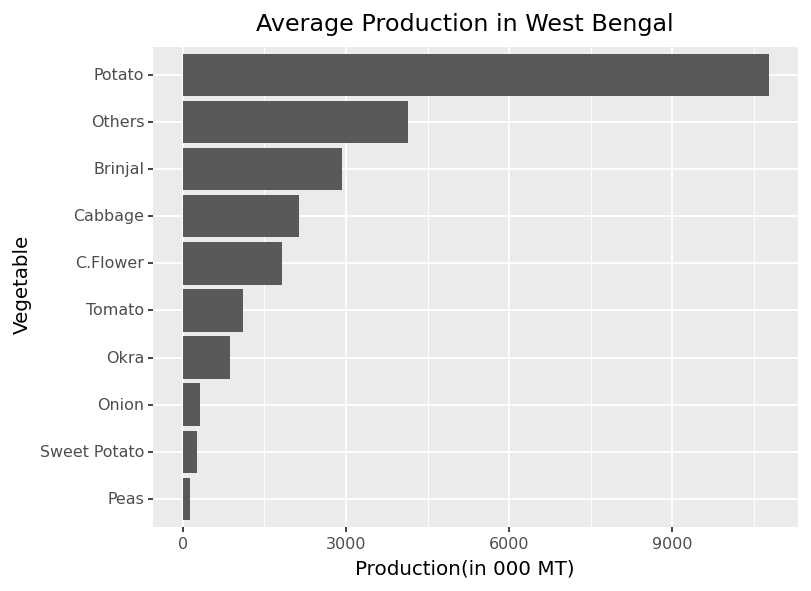

In [131]:
# Production over years
plot_state_production("West Bengal")

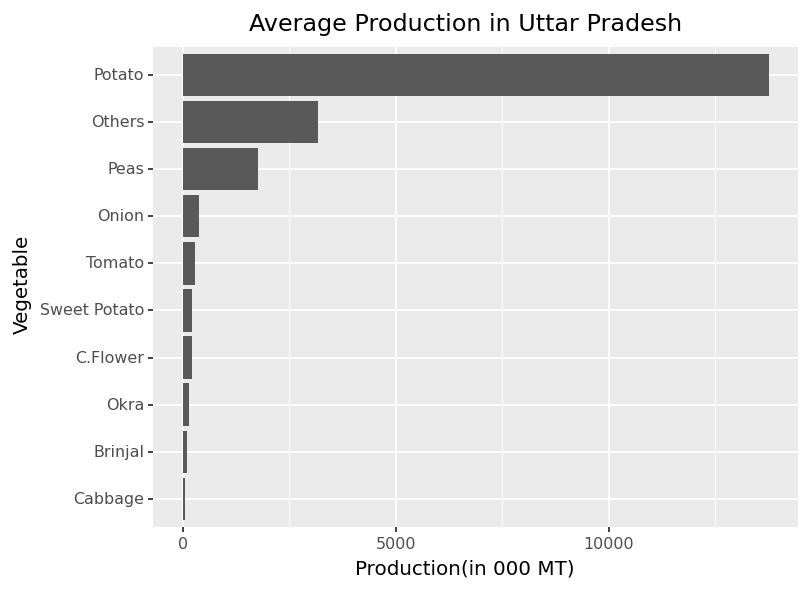

In [132]:
plot_state_production("Uttar Pradesh")

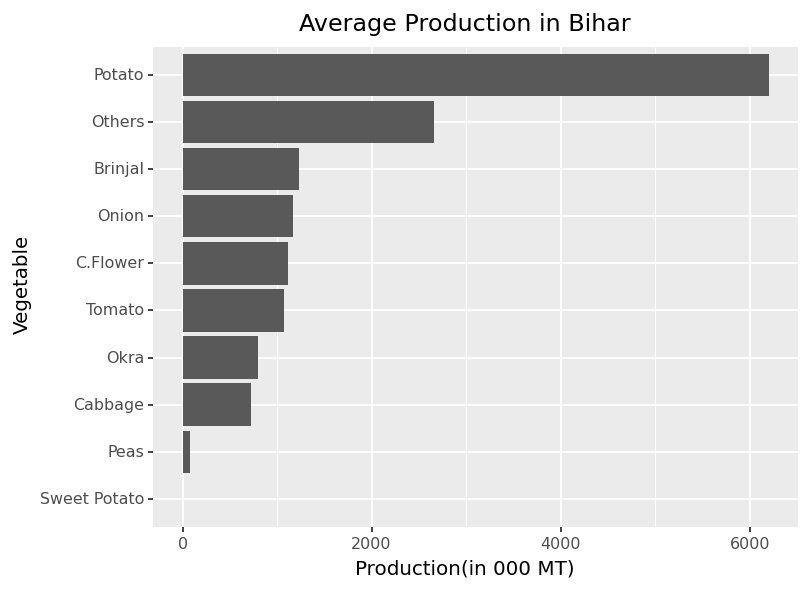

In [133]:
plot_state_production("Bihar")

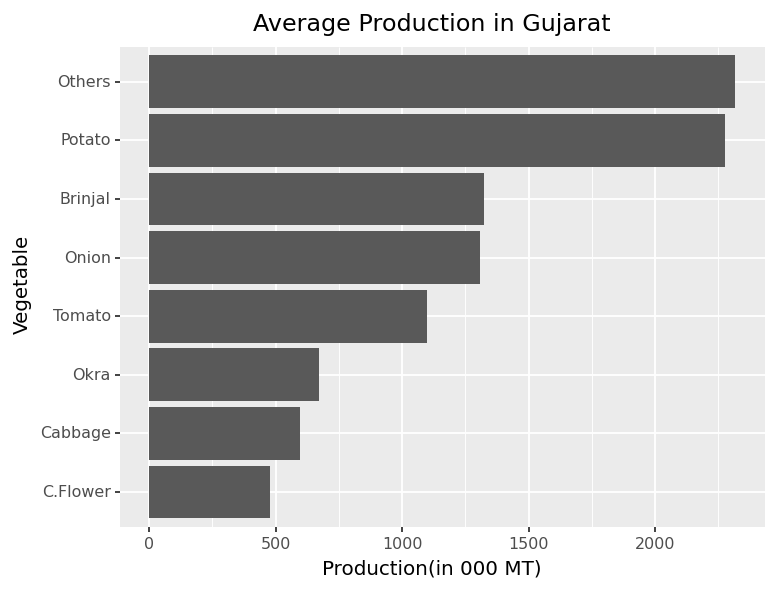

In [134]:
plot_state_production("Gujarat")

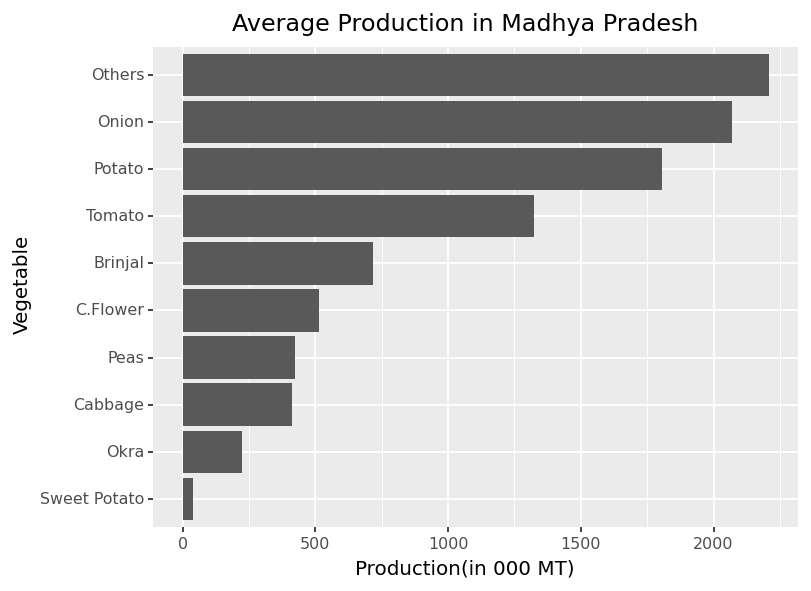

In [135]:
plot_state_production("Madhya Pradesh")

## Demand and Supply

In [136]:
demand=pd.read_csv("Demand_Production.csv")

In [137]:
demand=demand.melt(id_vars=["Years"],var_name="Type",value_name="Production(in 000 MT)")

In [138]:
def first_word(sentence):
    return sentence.split()[0]
def except_first_word(sentence):
    return " ".join(sentence.split()[1:])

In [139]:
demand["Vegetable"]=demand["Type"].apply(first_word)
demand["Type"]=demand["Type"].apply(except_first_word)

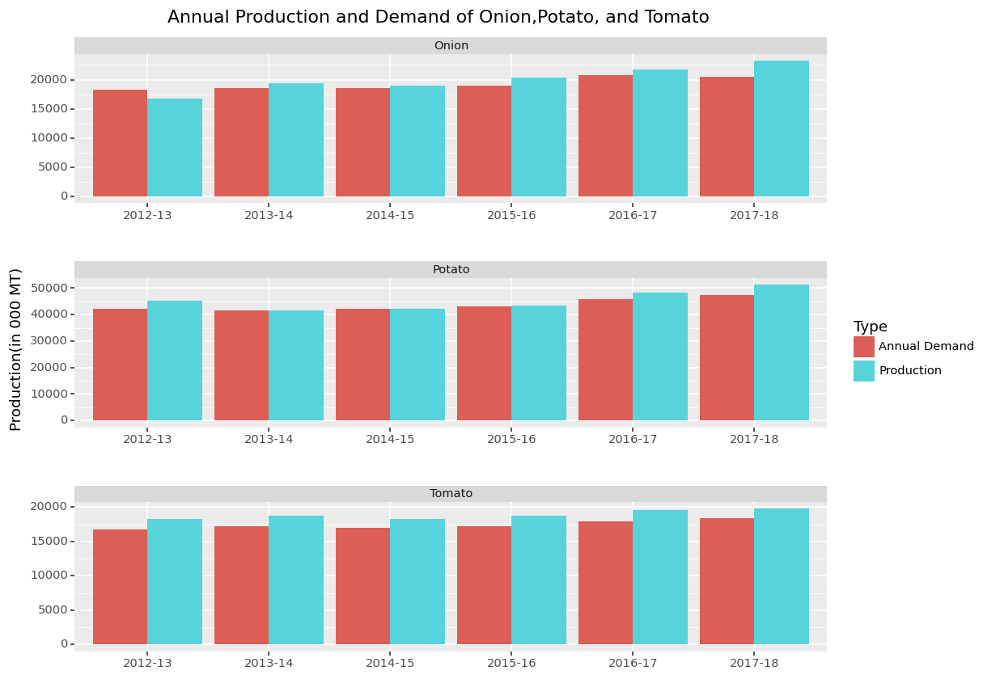

<ggplot: (136777895129)>

In [140]:
p=(ggplot(demand,aes(x="Years",y="Production(in 000 MT)",fill="Type"))+
geom_bar(stat="identity",position="dodge")+
facet_wrap("Vegetable",nrow=3,scales="free")+
  theme(subplots_adjust={'hspace': 0.5,'wspace':0.5},dpi=120,figure_size=(10, 8))+
  labs(x="",title="Annual Production and Demand of Onion,Potato, and Tomato"))
p.save("DemandvsProd.png",dpi=200)
p

## Contribution Within Horticulture

In [141]:
df=pd.read_csv("HorticulturePercentage.csv")

In [142]:
df=df[df["Crops"]!="Total Horticulture"]

In [143]:
df.replace("Flowers & Aromatics","Flowers",inplace=True)
df.replace("Plantation Crops","Plant Crops",inplace=True)

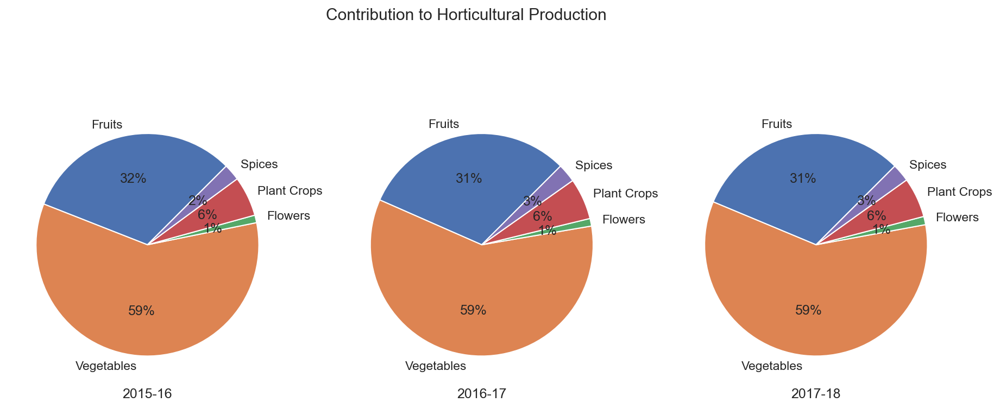

In [144]:
fig,axes=plt.subplots(1,3,figsize=(15,6))
for j in range(3):
    axes[j].pie(df.iloc[:,j+3].values,labels=df['Crops'],autopct='%.0f%%',startangle=45)
    axes[j].set_xlabel(df.columns[j+3])
plt.suptitle("Contribution to Horticultural Production")
plt.savefig("HortContr.png",dpi=200)
plt.show()

## Contribution of Horticulture Production in Total Production

In [145]:
hort_cont=pd.read_csv("Horticulture Output in Agriculture.csv")

In [146]:
hort_cont=hort_cont.melt(id_vars=["Type"],var_name="Year",value_name="Contribution(%)")

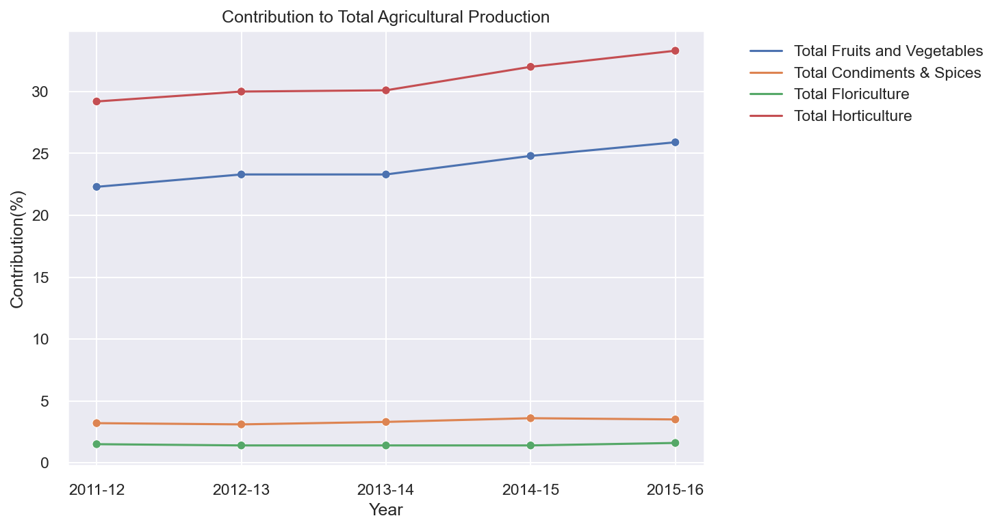

In [147]:
sns.lineplot(hort_cont,x="Year",y="Contribution(%)",hue="Type")
sns.scatterplot(hort_cont,x="Year",y="Contribution(%)",hue="Type")
plt.legend(handles=plt.gca().get_legend_handles_labels()[0][:4],bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.title("Contribution to Total Agricultural Production")
plt.savefig("AgrContr.png",dpi=200,bbox_inches="tight")
plt.show()

## Vegetable Production Percentage 2017-2018

In [148]:
vpp=pd.read_csv("VegetableProdPercent2017-2018.csv")

In [149]:
df=vpp[vpp["STATES/UTs"]!="All India Total"]

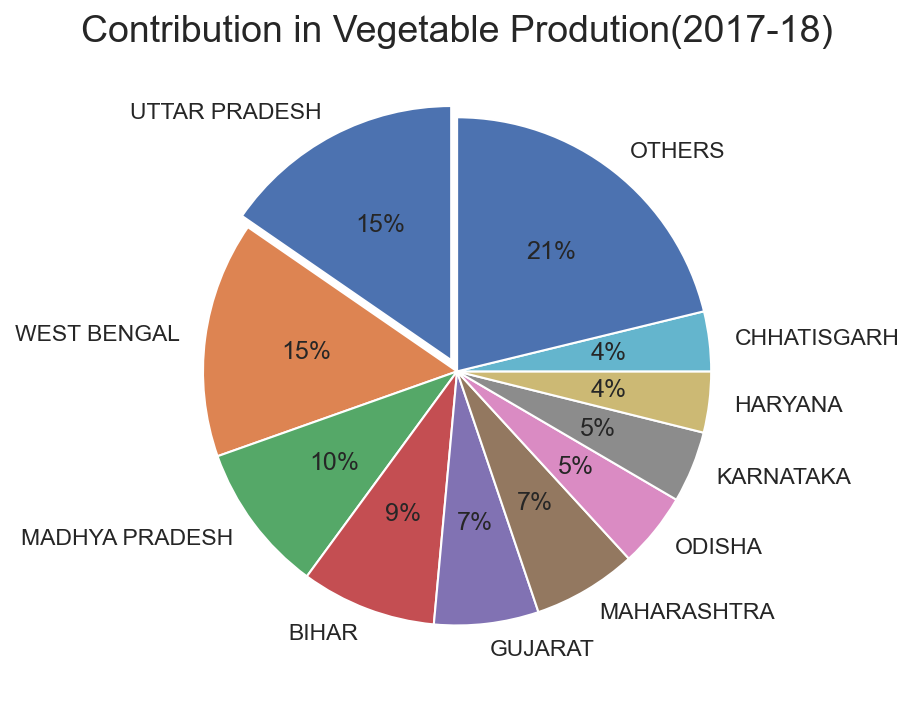

In [150]:
explode=[0.05,0,0,0,0,0,0,0,0,0,0]
plt.pie(df["% Share"].values,labels=df["STATES/UTs"],autopct='%.0f%%',startangle = 90,explode=explode)
plt.title("Contribution in Vegetable Prodution(2017-18)",size="18")
plt.savefig("VegContribution.png",dpi=200)
plt.show()

## Fruit Production Percentage 2017-2018

In [151]:
fpp=pd.read_csv("FruitProdPercent2017-2018.csv")

In [152]:
df=fpp[fpp["STATES/UTs"]!="All India Total"]

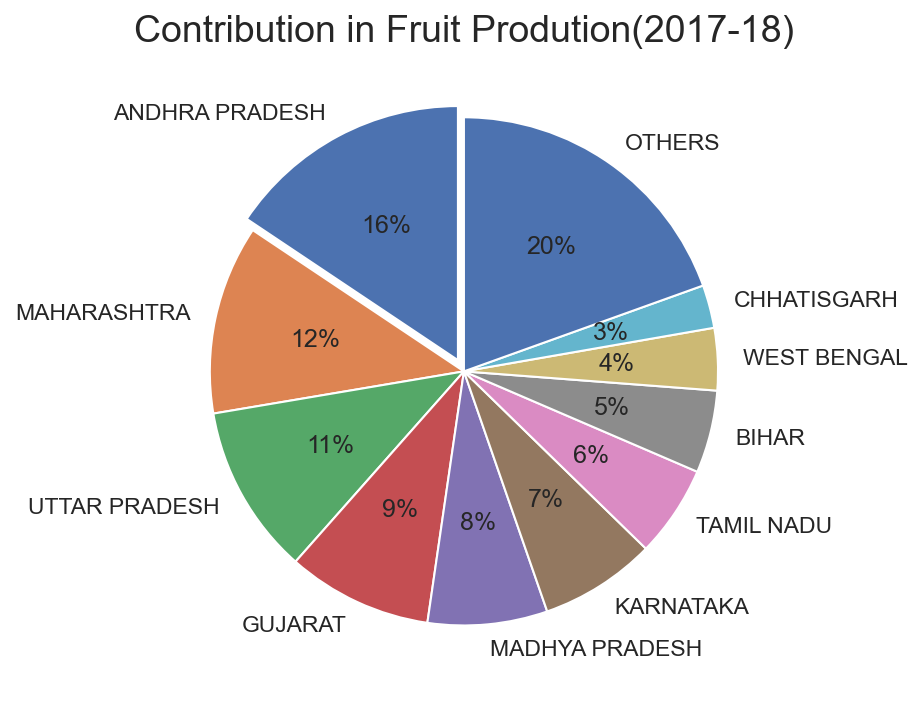

In [153]:
explode=[0.05,0,0,0,0,0,0,0,0,0,0]
plt.pie(df["% Share"].values,labels=df["STATES/UTs"],autopct='%.0f%%',startangle = 90,explode=explode)
plt.title("Contribution in Fruit Prodution(2017-18)",size="18")
plt.savefig("FruitContribution.png",dpi=200)
plt.show()

## Monthly Price of Onion, Tomato, Potato

In [154]:
onion=pd.read_csv("OnionMonthlyAvgPrice.csv")
potato=pd.read_csv("PotatoMonthlyAvgPrice.csv")
tomato=pd.read_csv("TomatoMonthlyAvgPrice.csv")

In [155]:
onion=onion.melt(id_vars=["Month"],var_name="Year",value_name="Price (Rupees/Kg)")
tomato=tomato.melt(id_vars=["Month"],var_name="Year",value_name="Price (Rupees/Kg)")
potato=potato.melt(id_vars=["Month"],var_name="Year",value_name="Price (Rupees/Kg)")

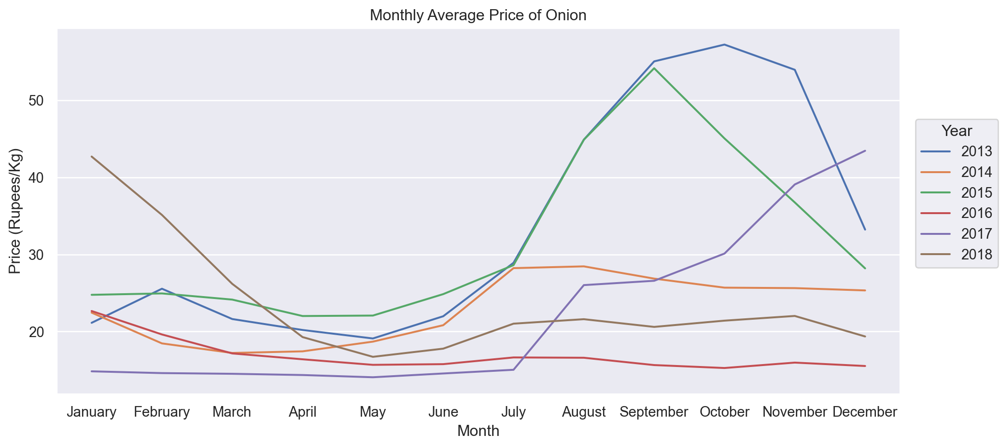

In [156]:
(so.Plot(onion, x="Month",y="Price (Rupees/Kg)",color="Year")
 .add(so.Line()).layout(size=(10, 5))
 .label(title="Monthly Average Price of Onion")
.save("OnionMonthlyPrice.png",dpi=200,bbox_inches="tight"))

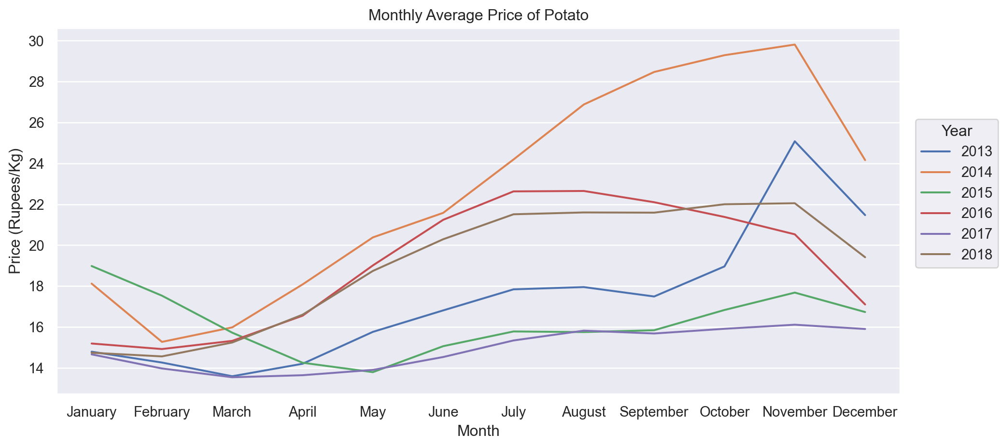

In [157]:
(so.Plot(potato, x="Month",y="Price (Rupees/Kg)",color="Year")
 .add(so.Line()).layout(size=(10, 5))
 .label(title="Monthly Average Price of Potato")
.save("PotatoMonthlyPrice.png",dpi=200,bbox_inches="tight"))

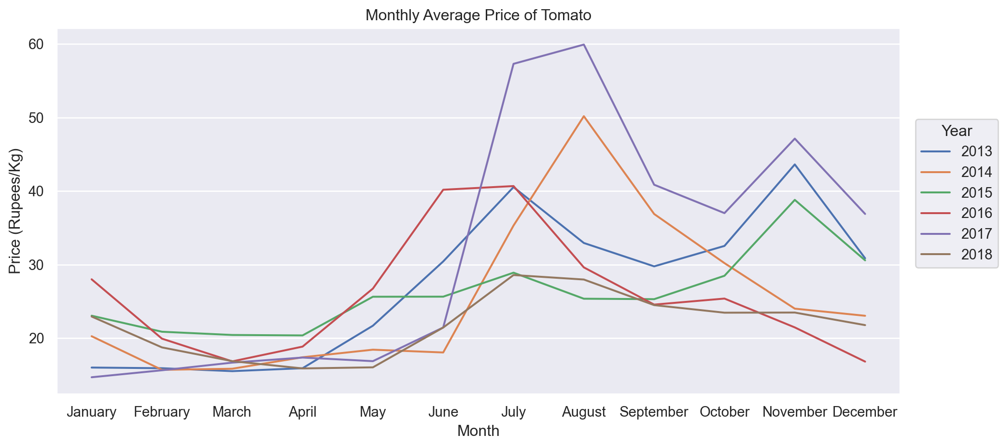

In [158]:
(so.Plot(tomato, x="Month",y="Price (Rupees/Kg)",color="Year")
 .add(so.Line()).layout(size=(10, 5))
 .label(title="Monthly Average Price of Tomato")
.save("TomatoMonthlyPrice.png",dpi=200,bbox_inches="tight"))

## Potato, Onion and Tomato

### Potato

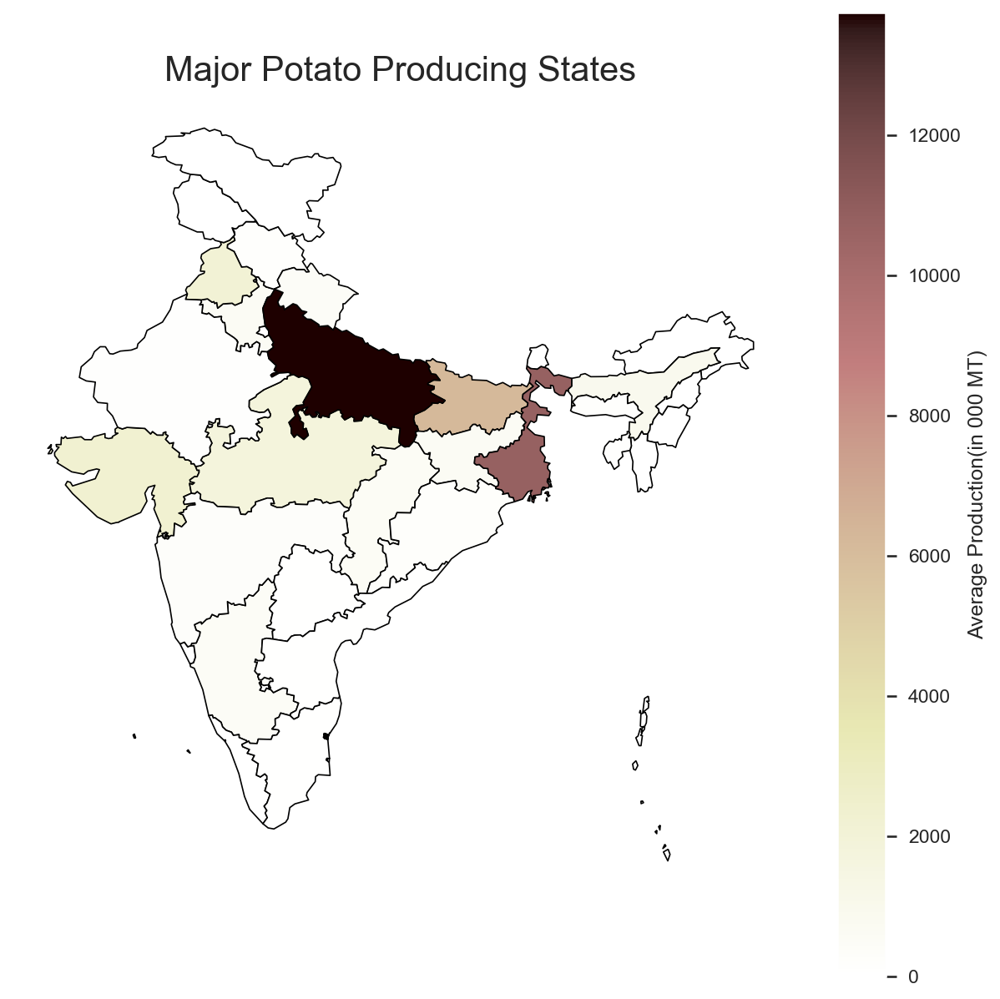

In [159]:
df=hort_df[hort_df["Vegetable"]=="Potato"]
df=df.groupby(by="State_UT_Name").mean().reset_index()
#Merging the data
merged = map_df.set_index('st_nm').join(df.set_index('State_UT_Name'))
merged['Production'] = merged['Production'].replace(np.nan, 0)
merged.head()
#Create figure and axes for Matplotlib and set the title
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.axis('off')
ax.set_title('Major Potato Producing States', fontdict={'fontsize': '20', 'fontweight' : '10'})
# Plot the figure
merged.plot(column='Production',cmap='pink_r', linewidth=0.8, ax=ax, edgecolor='0',legend=True,markersize=[39.739192, -104.990337], legend_kwds={'label': "Average Production(in 000 MT)"})
plt.savefig("PotatoStates.png",dpi=200,bbox_inches="tight")
plt.show()

In [160]:
potato_recent=pd.read_csv("PotatoProd.csv")

In [161]:
potato_recent.drop(columns=["No."],inplace=True)

pr=potato_recent.melt(id_vars=["STATES/Uts"],var_name="Type",value_name="value")

pr["Year"]=pr["Type"].apply(lambda x : x.split()[0])

pr["Type"]=pr["Type"].apply(lambda x : x.split()[-1])

pr.replace("A","Area (in 000 Ha)",inplace=True)
pr.replace("P","Production (in 000 MT)",inplace=True)

In [162]:
def capitalize(sentence):
    new_sentence = ""
    for word in sentence.split():
        if word.lower() == "and":
            new_sentence += "and "
        else:
            new_sentence += word[0].upper() + word.lower()[1:] + " "
    return new_sentence[:-1]

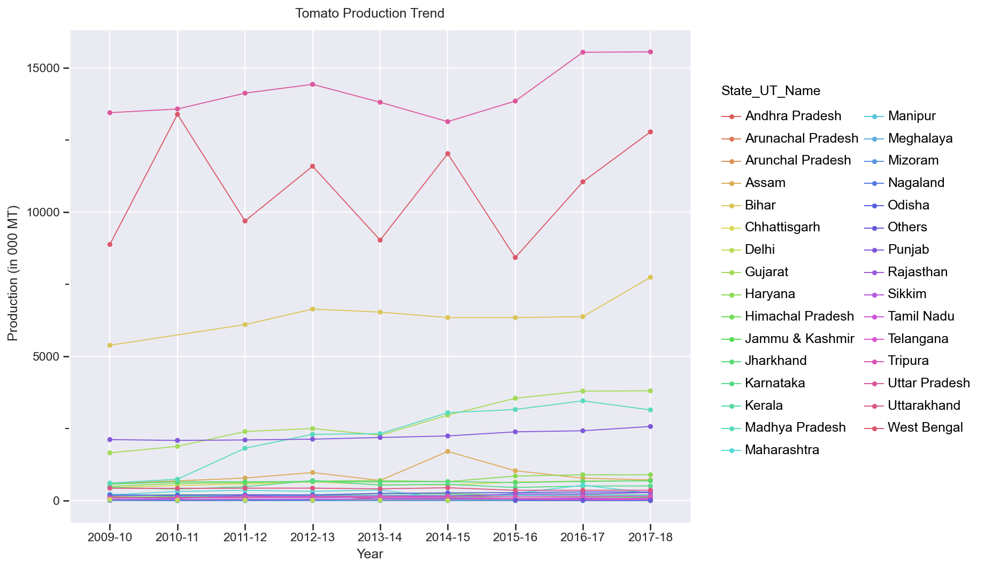

<ggplot: (136772921468)>

In [163]:
pr["STATES/Uts"]=pr["STATES/Uts"].apply(capitalize)

pr.rename(columns={"STATES/Uts":"State_UT_Name"},inplace=True)

df=hort_df[hort_df["Vegetable"]=="Potato"]
df.drop(columns=["Category","Vegetable"],inplace=True)

df.rename(columns={'Production':"Production (in 000 MT)","Area":"Area (in 000 Ha)"},inplace=True)

df=df.melt(id_vars=["State_UT_Name","Year"],var_name="Type",value_name="value")

df=pd.concat([df,pr]).reset_index()
df.drop(columns=["index"],inplace=True)

df1=df[df["Type"]=="Production (in 000 MT)"]

df1=df1[df1["State_UT_Name"]!="Total"]

p=(ggplot(df1,aes(x="Year",y="value",group="State_UT_Name",color="State_UT_Name"))+geom_line()+
   geom_point()+
   labs(y="Production (in 000 MT)",title="Tomato Production Trend")+
   theme_seaborn()+theme(dpi=150,figure_size=(10,8)))
p.save("Potato Trend.png",dpi=150)
p

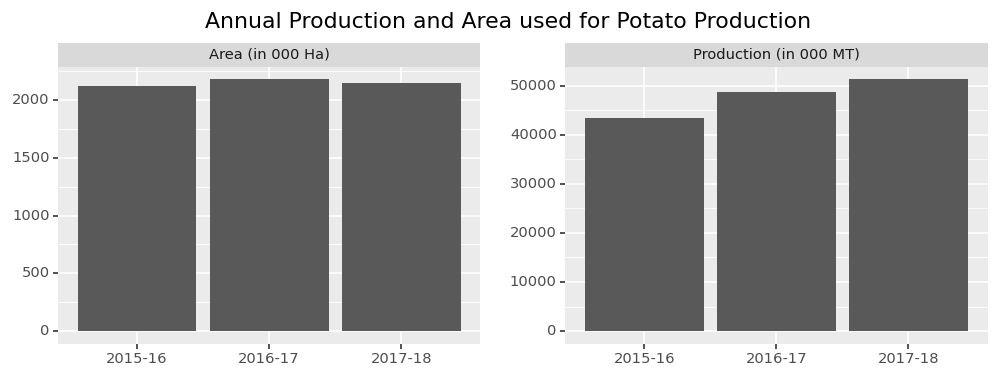

<ggplot: (136781608888)>

In [164]:
df=pr[pr["State_UT_Name"]=="Total"]
p=(ggplot(df,aes(x="Year",y="value"))+geom_bar(stat="identity")+
   facet_wrap("Type",scales="free")+
  theme(subplots_adjust={'wspace':0.2},dpi=120,figure_size=(10, 3))+
  labs(x="",y="",title="Annual Production and Area used for Potato Production"))
p.save("PotatoAnnual.png",dpi=200)
p

### Tomato 

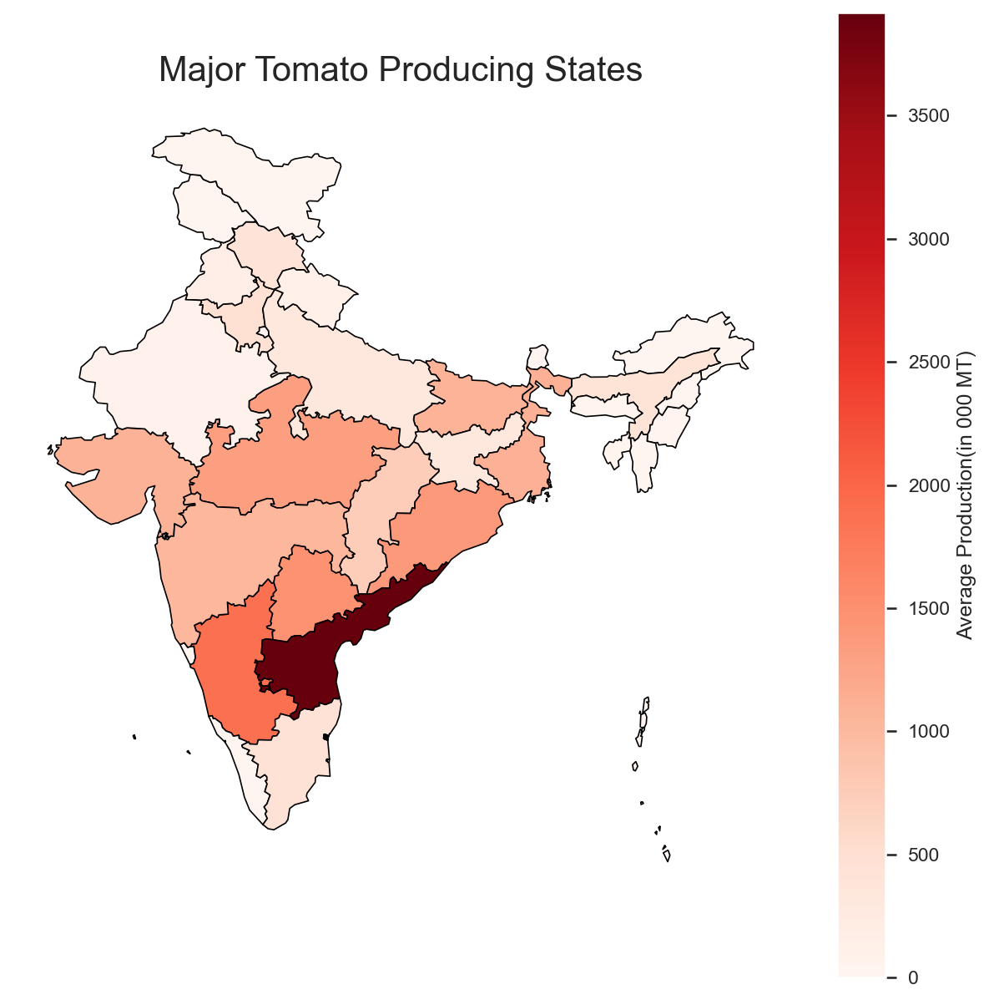

In [165]:
df=hort_df[hort_df["Vegetable"]=="Tomato"]
df=df.groupby(by="State_UT_Name").mean().reset_index()
#Merging the data
merged = map_df.set_index('st_nm').join(df.set_index('State_UT_Name'))
merged['Production'] = merged['Production'].replace(np.nan, 0)
merged.head()
#Create figure and axes for Matplotlib and set the title
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.axis('off')
ax.set_title('Major Tomato Producing States', fontdict={'fontsize': '20', 'fontweight' : '10'})
# Plot the figure
merged.plot(column='Production',cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0',legend=True,markersize=[39.739192, -104.990337], legend_kwds={'label': "Average Production(in 000 MT)"})
plt.savefig("TomatoStates.png",dpi=200,bbox_inches="tight")
plt.show()

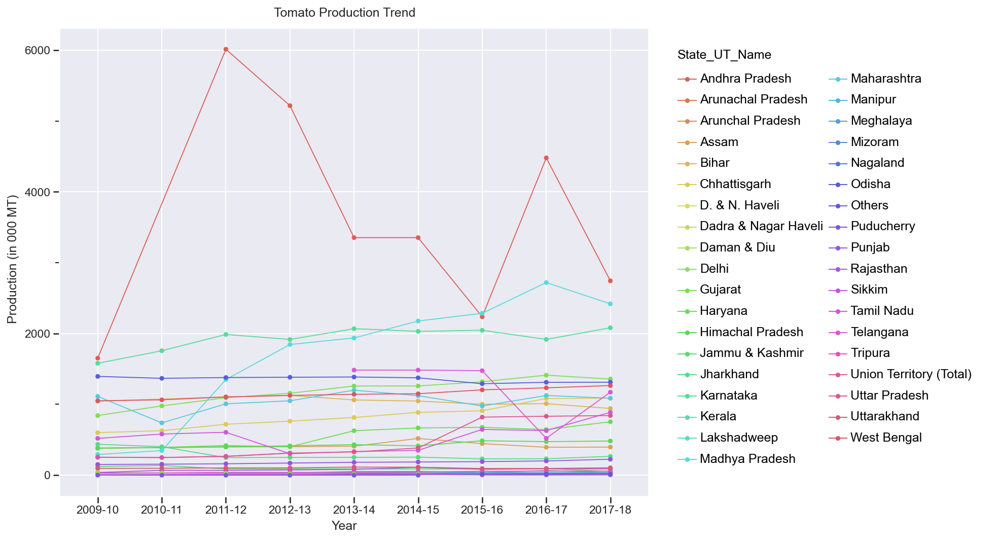

<ggplot: (136784353970)>

In [166]:
tomato_recent=pd.read_csv("TomatoProd.csv")
tomato_recent.drop(columns=["No."],inplace=True)

tr=tomato_recent.melt(id_vars=["STATES/Uts"],var_name="Type",value_name="value")

tr["Year"]=tr["Type"].apply(lambda x : x.split()[0])

tr["Type"]=tr["Type"].apply(lambda x : x.split()[-1])

tr.replace("A","Area (in 000 Ha)",inplace=True)
tr.replace("P","Production (in 000 MT)",inplace=True)

tr["STATES/Uts"]=tr["STATES/Uts"].apply(capitalize)

tr.rename(columns={"STATES/Uts":"State_UT_Name"},inplace=True)

df=hort_df[hort_df["Vegetable"]=="Tomato"]
df.drop(columns=["Category","Vegetable"],inplace=True)

df.rename(columns={'Production':"Production (in 000 MT)","Area":"Area (in 000 Ha)"},inplace=True)

df=df.melt(id_vars=["State_UT_Name","Year"],var_name="Type",value_name="value")

df=pd.concat([df,tr]).reset_index()
df.drop(columns=["index"],inplace=True)

df1=df[df["Type"]=="Production (in 000 MT)"]

df1=df1[df1["State_UT_Name"]!="Total"]

p=(ggplot(df1,aes(x="Year",y="value",group="State_UT_Name",color="State_UT_Name"))+geom_line()+
   geom_point()+
   labs(y="Production (in 000 MT)",title="Tomato Production Trend")+
   theme_seaborn()+theme(dpi=150,figure_size=(10,8)))
p.save("Tomato Trend.png",dpi=150)
p

### Onion

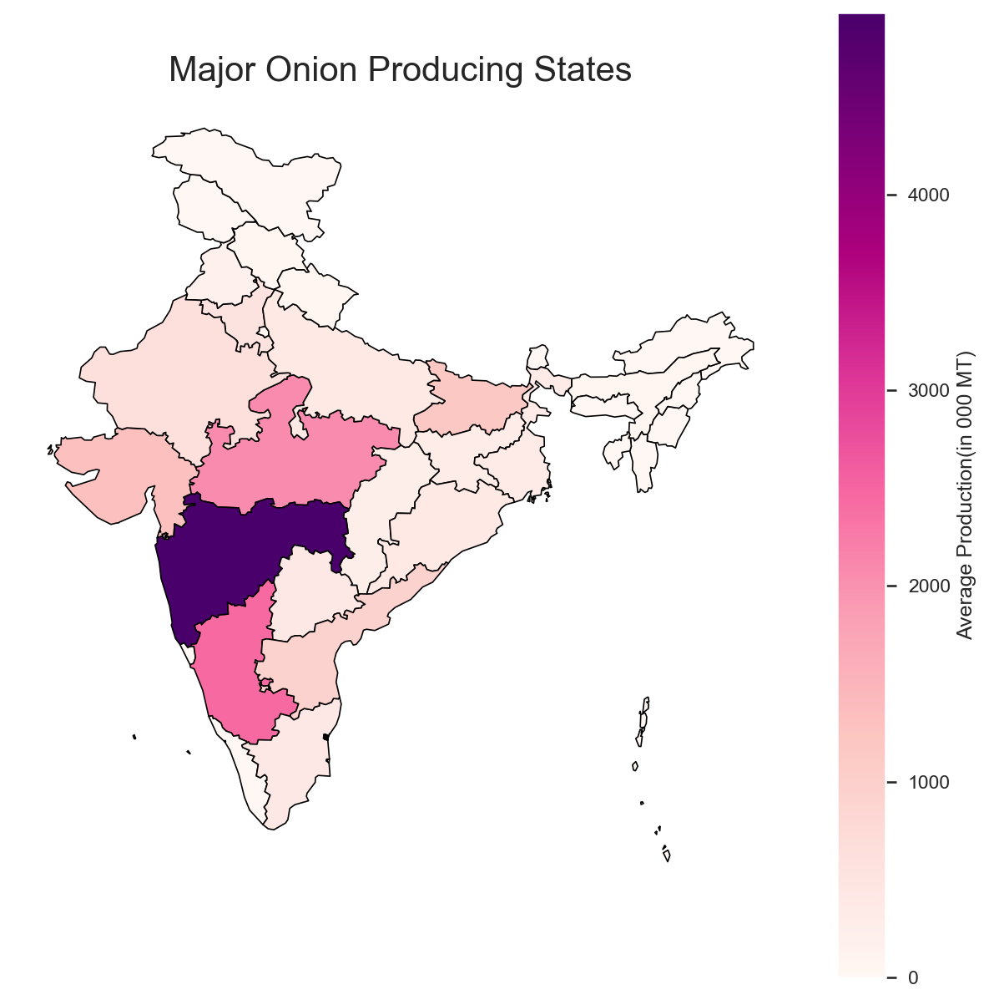

In [167]:
df=hort_df[hort_df["Vegetable"]=="Onion"]
df=df.groupby(by="State_UT_Name").mean().reset_index()
#Merging the data
merged = map_df.set_index('st_nm').join(df.set_index('State_UT_Name'))
merged['Production'] = merged['Production'].replace(np.nan, 0)
merged.head()
#Create figure and axes for Matplotlib and set the title
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.axis('off')
ax.set_title('Major Onion Producing States', fontdict={'fontsize': '20', 'fontweight' : '10'})
# Plot the figure
merged.plot(column='Production',cmap='RdPu', linewidth=0.8, ax=ax, edgecolor='0',legend=True,markersize=[39.739192, -104.990337], legend_kwds={'label': "Average Production(in 000 MT)"})
plt.savefig("OnionStates.png",dpi=200,bbox_inches="tight")
plt.show()

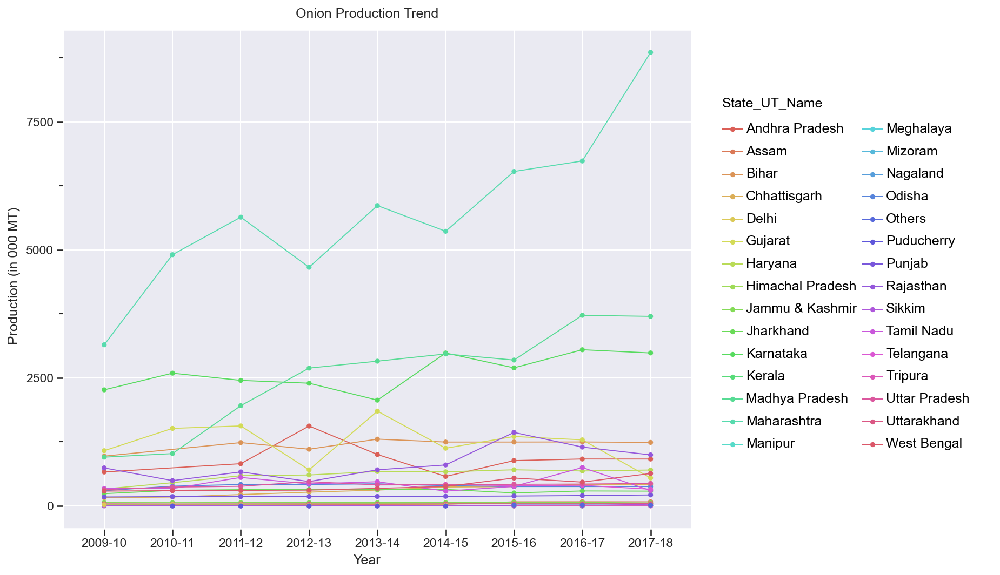

<ggplot: (136784246456)>

In [168]:
Onion_recent=pd.read_csv("OnionProd.csv")
Onion_recent.drop(columns=["No."],inplace=True)

Or=Onion_recent.melt(id_vars=["STATES/Uts"],var_name="Type",value_name="value")

Or["Year"]=Or["Type"].apply(lambda x : x.split()[0])

Or["Type"]=Or["Type"].apply(lambda x : x.split()[-1])

Or.replace("A","Area (in 000 Ha)",inplace=True)
Or.replace("P","Production (in 000 MT)",inplace=True)
Or["STATES/Uts"]=Or["STATES/Uts"].apply(capitalize)

Or.rename(columns={"STATES/Uts":"State_UT_Name"},inplace=True)

df=hort_df[hort_df["Vegetable"]=="Onion"]
df.drop(columns=["Category","Vegetable"],inplace=True)

df.rename(columns={'Production':"Production (in 000 MT)","Area":"Area (in 000 Ha)"},inplace=True)

df=df.melt(id_vars=["State_UT_Name","Year"],var_name="Type",value_name="value")

df=pd.concat([df,Or]).reset_index()
df.drop(columns=["index"],inplace=True)

df1=df[df["Type"]=="Production (in 000 MT)"]

df1=df1[df1["State_UT_Name"]!="Total"]

p=(ggplot(df1,aes(x="Year",y="value",group="State_UT_Name",color="State_UT_Name"))+geom_line()+
   geom_point()+
   labs(y="Production (in 000 MT)",title="Onion Production Trend")+
   theme_seaborn()+
   theme(dpi=150)+theme(dpi=150,figure_size=(10,8)))
p.save("Onion Trend.png",dpi=150)
p

## Import of Fruit and Vegetables

In [169]:
importfv=pd.read_csv("Import_Fruit_Vegetables.csv")

In [170]:
def extract_year(sentence):
    return sentence.split()[0]

In [171]:
def extract_type(sentence):
    return sentence.split()[1]

In [172]:
importfv=importfv.melt(id_vars=["Country"],var_name="Type",value_name="Value")

In [173]:
importfv["Year"]=importfv["Type"].apply(extract_year)

In [174]:
importfv["Type"]=importfv["Type"].apply(extract_type)

In [175]:
importfv.replace("Qty","Quantity(in 000 MT)",inplace=True)

In [176]:
importfv.replace("Value","Value(in Crores)",inplace=True)

In [177]:
df=importfv[importfv["Country"]=="Total"]

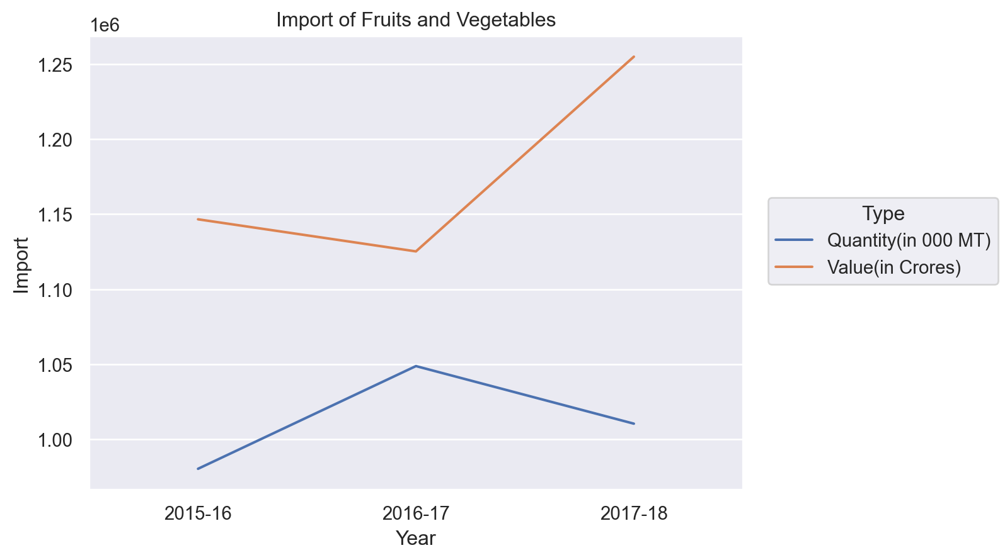

In [178]:
(so.Plot(df, x="Year", y="Value",color="Type")
 .add(so.Line())
 .label(y="Import",title="Import of Fruits and Vegetables")
)

In [179]:
L=["USA",'Australia','Pakistan','China','Iran','Others']
df=importfv[importfv["Country"].isin(L)]

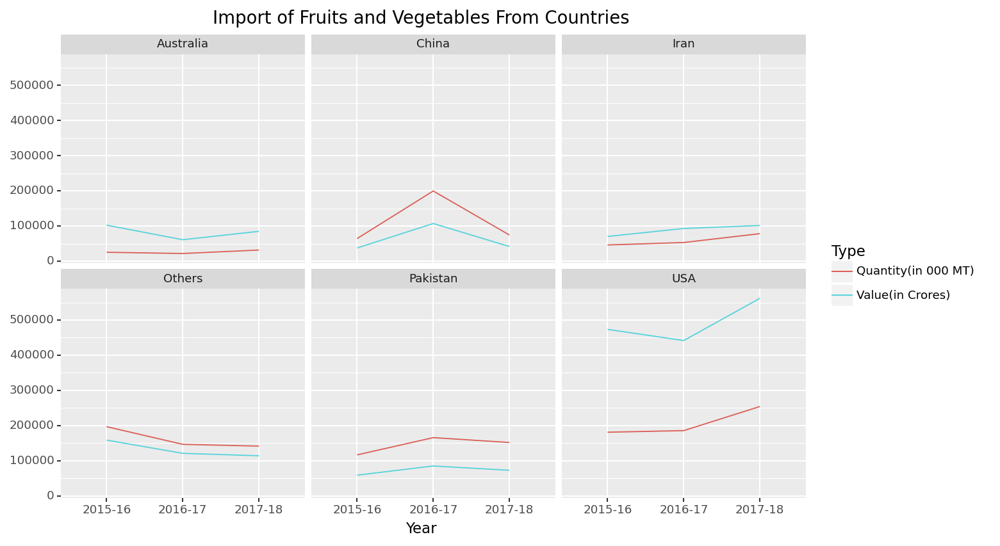

<ggplot: (136778542743)>

In [180]:
(ggplot(df, aes(x="Year", y="Value",color="Type",group="Type"))+
 geom_line()+
 facet_wrap("Country",nrow=2)+
theme(dpi=150,figure_size=(10,6))+
 labs(title="Import of Fruits and Vegetables From Countries",y=""))


# Crop 

In [181]:
crop_path=path+"\Agriculture\Crop"
os.chdir(crop_path)

In [182]:
crop_df=pd.read_csv("crop_production.csv")

In [183]:
crop_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246091 entries, 0 to 246090
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   State_Name     246091 non-null  object 
 1   District_Name  246091 non-null  object 
 2   Crop_Year      246091 non-null  int64  
 3   Season         246091 non-null  object 
 4   Crop           246091 non-null  object 
 5   Area           246091 non-null  float64
 6   Production     242361 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 13.1+ MB


Only production contains null values

In [184]:
crop_df.columns

Index(['State_Name', 'District_Name', 'Crop_Year', 'Season', 'Crop', 'Area',
       'Production'],
      dtype='object')

In [185]:
crop_df.dropna(0,inplace=True)

  
Kharif season
In India, the season is popularly considered to start in June and end in October.  

Rabi : The season where crops are sown in mid-November and harvested in April/May is called Rabi Season.

## TOP Produced crops over the years

Productivity: The productivity of agriculture refers to the amount of output produced per unit of land. High productivity means that more output is produced per unit of land, while low productivity means that less output is produced per unit of land.

In [186]:
crop_df['Productivity']=crop_df['Production']/crop_df['Area']

In [187]:
crop_df.replace("Coconut ","Coconut",inplace=True)

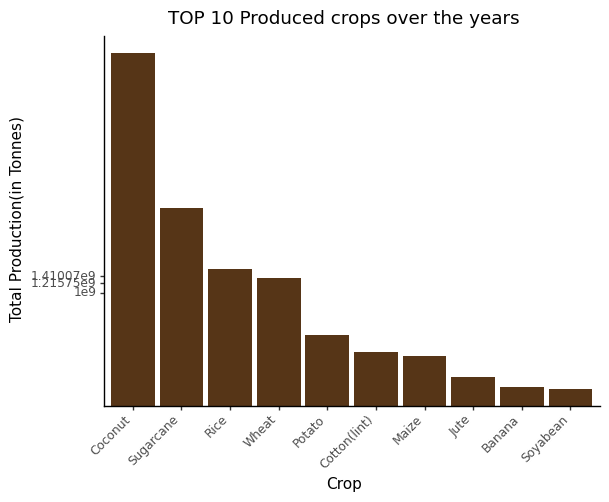

<ggplot: (136796239481)>

In [188]:
df=crop_df[["Crop","Production"]].groupby(by="Crop").sum().sort_values(by="Production",ascending=False)[:10]
df['Crop']=df.index
p=(ggplot(df, aes(x='reorder(Crop,Production,ascending=False)', y='Production'))+
 geom_bar(stat='identity',fill='#563517')+
 labs(title='TOP 10 Produced crops over the years', y='Total Production(in Tonnes)', x='Crop')+
 scale_y_log10()+
 theme_classic()+
 theme(axis_text_x=element_text(angle=45, hjust=1)))
p.save("Top 10 Produced crops.png",dpi=300)
p

In [189]:
crops=crop_df["Crop"].unique()

In [190]:
Top_crops=["Coconut","Sugarcane","Rice","Wheat","Potato","Cotton(lint)","Maize","Jute","Banana","Soyabean","Others"]

## Total Area

In [191]:
Total_area=crop_df['Area'].sum()
Total_area
area_used=[]
for i in range(len(crops)):
    area_used.append((crop_df[crop_df['Crop']==crops[i]]['Area'].sum())*100/Total_area)
area_used=np.array(area_used)

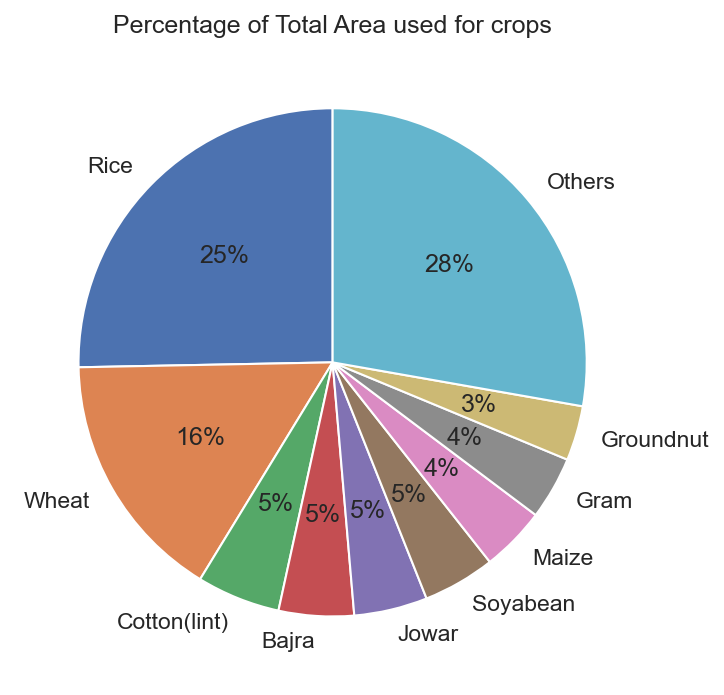

In [192]:
sorted_indices=np.argsort(area_used)[::-1]
area_used=area_used[sorted_indices]
area_used.cumsum()
crops=crops[sorted_indices]
area_used_pie=area_used[:10].copy()
area_used_pie[9]=area_used.sum()-area_used[:9].sum()
crops_pie=crops[:10]
crops_pie[9]="Others"
plt.pie(area_used_pie,labels=crops_pie,startangle=90,autopct='%.0f%%')
plt.title("Percentage of Total Area used for crops")
plt.savefig("Area_pie.png",dpi=150)
plt.show()

In [193]:
def plot_crop_production(crop,color_map="tab10"):
    '''
    Plot details(Area, Production and Productivity) of the given crop
    '''
    df=crop_df.copy()
    df=df[df["Crop"]==crop].groupby("State_Name").sum().reset_index().sort_values(by="Production",ascending=False)[:5]
    df.drop(columns=["Crop_Year"],inplace=True)

    fig,axes=plt.subplots(1,3,figsize=(14, 6))
    fig.suptitle(f"Top 5 {crop} Producing States(1997-2015) in India")
    sns.barplot(df,y="State_Name",x="Production",ax=axes[0],palette=color_map)
    axes[0].set_ylabel('State')
    axes[0].set_xlabel("Production(in Thousand Tonnes)")
    axes[0].set_title("Total Productiion")
    axes[0].set_xticklabels(axes[0].get_xticks(), rotation = 45)
    axes[0].set_xscale('log')

    sns.barplot(df,y="State_Name",x="Area",ax=axes[1],palette=color_map)
    axes[1].set_ylabel('')
    axes[1].set_yticks([])
    axes[1].set_xlabel("Area(in Thousand Ha)")
    axes[1].set_title("Total Area Used")
    axes[1].set_xticklabels(axes[1].get_xticks(), rotation = 45)
    axes[1].set_xscale('log')

    sns.barplot(df,y="State_Name",x="Productivity",ax=axes[2],palette=color_map)
    axes[2].set_ylabel('')
    axes[2].set_yticks([])
    axes[2].set_xlabel("Productivity(in T/Ha)")
    axes[2].set_title("Productivity")
    axes[2].set_xticklabels(axes[2].get_xticks(), rotation = 45)
    axes[2].set_xscale('log')
    plt.savefig(f"{crop}.png",dpi=200)
    plt.show()

## Coconut

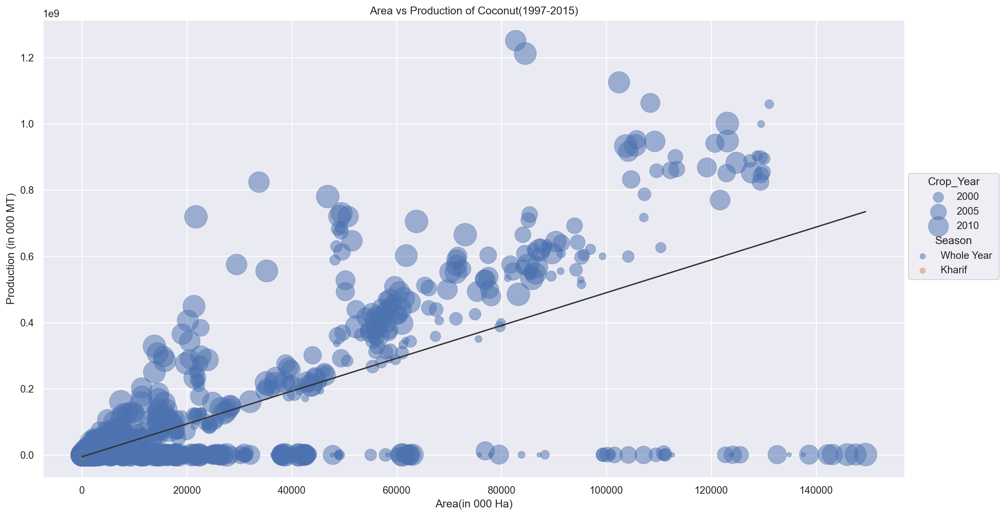

In [194]:
coconut_df=crop_df[crop_df["Crop"]=="Coconut"]

df=coconut_df[coconut_df["Production"]!=0.0]
df.sort_values(by="Crop_Year",ascending=False,inplace=True)
(
    so.Plot(df,x="Area", 
            y='Production')
    .add(so.Line(color=".2"), so.PolyFit(order=1),y="Production")
    .add(so.Dot(alpha=0.5),pointsize="Crop_Year",color="Season")
    
    .scale(pointsize=(5,25))
    .layout(size=(14, 8))
    .label(x="Area(in 000 Ha)",y="Production (in 000 MT)",
           title="Area vs Production of Coconut(1997-2015)")
    .save("AvPCoconut.png",dpi=200,bbox_inches='tight')
)


In [195]:
# ggplot(df,aes(x="Area",y="Production",fill="Crop_Year"))+geom_point(aes(size="Crop_Year"),alpha=0.5)

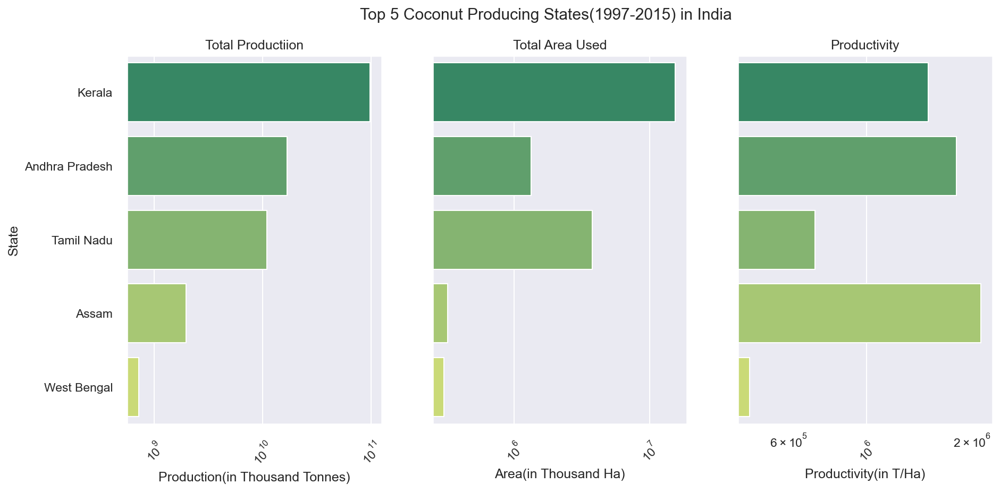

In [196]:
plot_crop_production("Coconut","summer")

## Sugarcane 

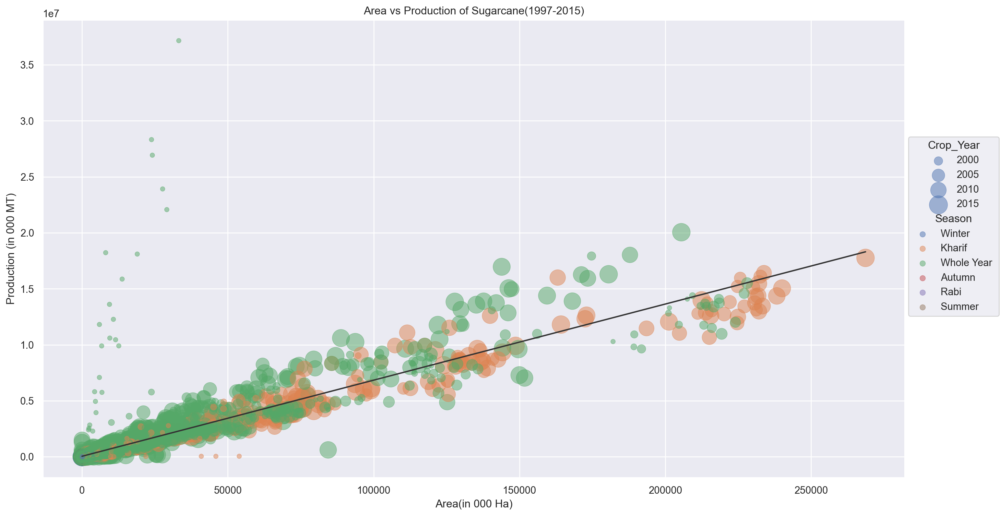

In [197]:
sugarcane_df=crop_df[crop_df["Crop"]=="Sugarcane"]

df=sugarcane_df[sugarcane_df["Production"]!=0.0]

df.sort_values(by="Crop_Year",ascending=False,inplace=True)

(
    so.Plot(df,x="Area", 
            y='Production')
    .add(so.Line(color=".2"), so.PolyFit(order=1),y="Production")
    .add(so.Dot(alpha=0.5),pointsize="Crop_Year",color="Season")
    .layout(size=(14, 8))
    .scale(pointsize=(5,20))
    .label(x="Area(in 000 Ha)",y="Production (in 000 MT)",
           title="Area vs Production of Sugarcane(1997-2015)")
    .save("AvPSugarcane.png",dpi=200,bbox_inches='tight')
)


In [198]:
df=sugarcane_df.groupby("State_Name").sum().reset_index().sort_values(by="Production",ascending=False)[:5]

In [199]:
top_states=list(df["State_Name"].unique())

In [200]:
df=sugarcane_df[sugarcane_df["State_Name"].isin(top_states)]

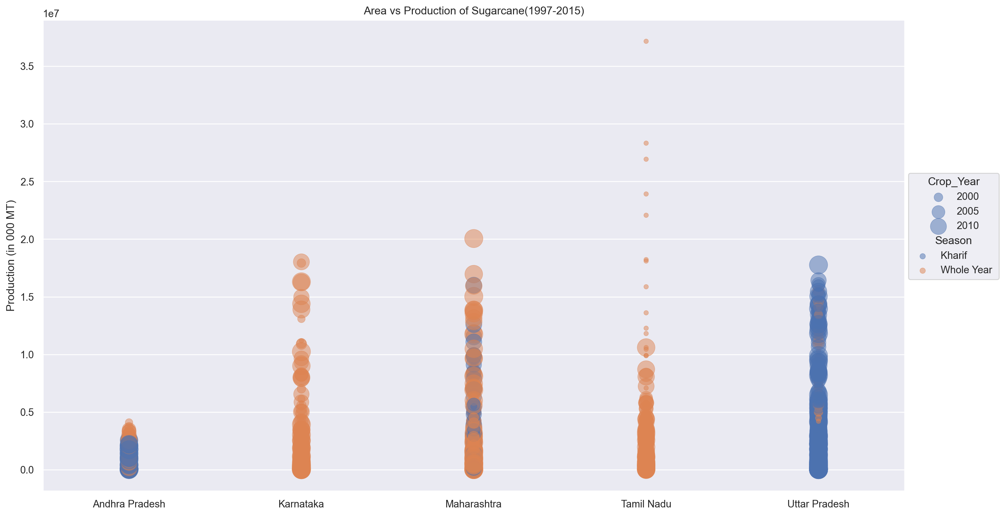

In [201]:
(
    so.Plot(df,x="State_Name", 
            y='Production')
    .add(so.Dot(alpha=0.5),pointsize="Crop_Year",color="Season")
    .layout(size=(14, 8))
    .scale(pointsize=(5,20))
    .label(x="",y="Production (in 000 MT)",
           title="Area vs Production of Sugarcane(1997-2015)")
    # .save("AvPSugarcane1.png",dpi=200,bbox_inches='tight')
)


Sugarcane production in tamil nadu indicates discrepancy in data, in some places there are extra zeros placed,
we replace the production values there by its appropriate value.

In [202]:
crop_df.loc[(crop_df["Crop_Year"]==1997)&(crop_df["State_Name"]=="Tamil Nadu")& (crop_df["Crop"]=="Sugarcane"),"Production"]=crop_df[(crop_df["Crop_Year"]==1997)&(crop_df["State_Name"]=="Tamil Nadu")]["Production"]/10
crop_df.loc[(crop_df["Crop_Year"]==1997)&(crop_df["State_Name"]=="Tamil Nadu")& (crop_df["Crop"]=="Sugarcane"),"Productivity"]=crop_df[(crop_df["Crop_Year"]==1997)&(crop_df["State_Name"]=="Tamil Nadu")]["Productivity"]/10

In [203]:
df=sugarcane_df.groupby("State_Name").sum().reset_index().sort_values(by="Production",ascending=False)[:5]
df.drop(columns=['Crop_Year'],inplace=True)
df1=df.melt(id_vars=['State_Name'],var_name="Type",value_name="Value")

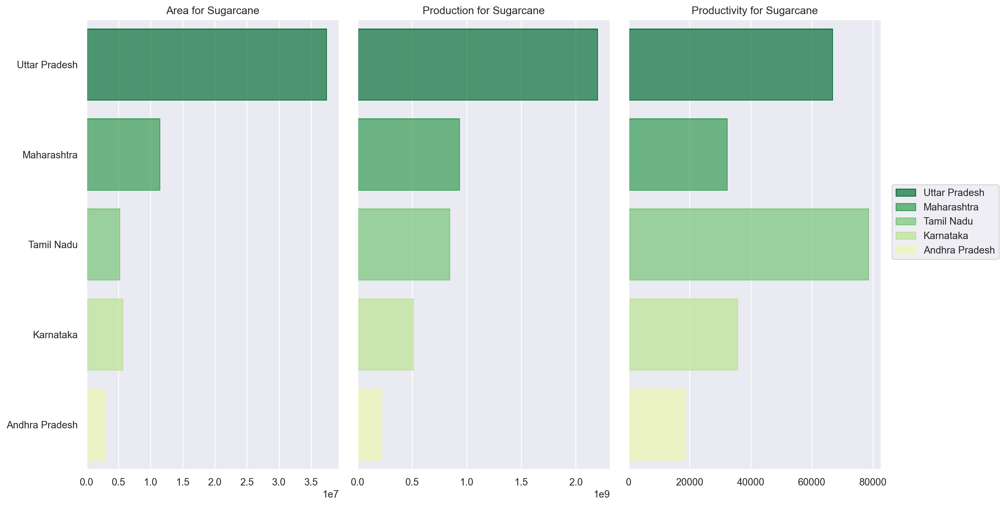

In [204]:
(so.Plot(df1, x="Value", y="State_Name",color="State_Name").add(so.Bar()).facet("Type").share(x=False)
 .label(x="",y="",color="",title="{} for Sugarcane".format)
.scale(color=so.Nominal("YlGn_r"))
.layout(size=(14, 8))
.save("Sugarcane.png",dpi=200,bbox_inches='tight'))

## Rice

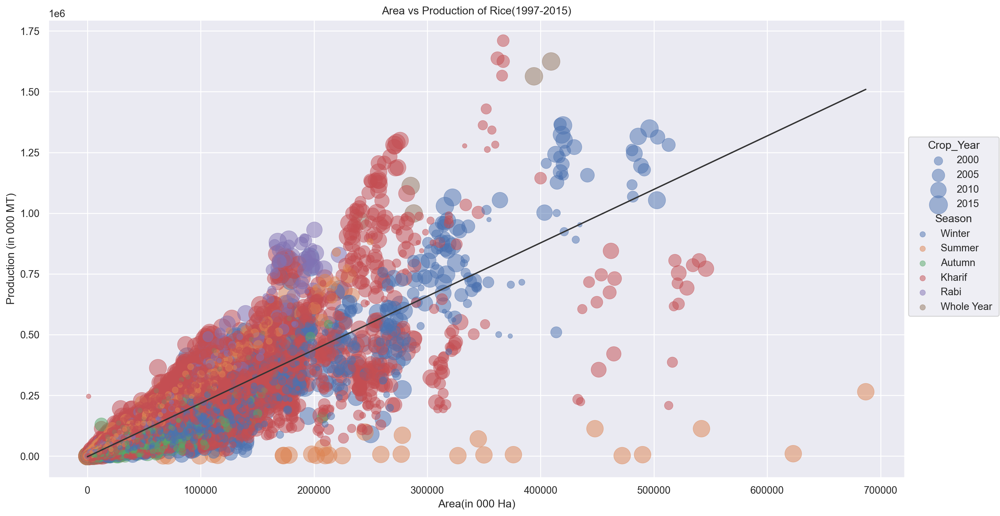

In [205]:
rice_df=crop_df[crop_df["Crop"]=="Rice"]

df=rice_df[rice_df["Production"]!=0.0]

df.sort_values(by="Crop_Year",ascending=False,inplace=True)

(
    so.Plot(df,x="Area", 
            y='Production')
    .add(so.Line(color=".2"), so.PolyFit(order=1),y="Production")
    .add(so.Dot(alpha=0.5),pointsize="Crop_Year",color="Season")
    .scale(pointsize=(5,20))
    .label(x="Area(in 000 Ha)",y="Production (in 000 MT)",
           title="Area vs Production of Rice(1997-2015)")
    .layout(size=(14, 8))
    .save("AvPRice.png",dpi=200,bbox_inches='tight')
)


In [206]:
df=rice_df.groupby("State_Name").sum().reset_index().sort_values(by="Production",ascending=False)[:5]
df.drop(columns=['Crop_Year'],inplace=True)
df1=df.melt(id_vars=['State_Name'],var_name="Type",value_name="Value")

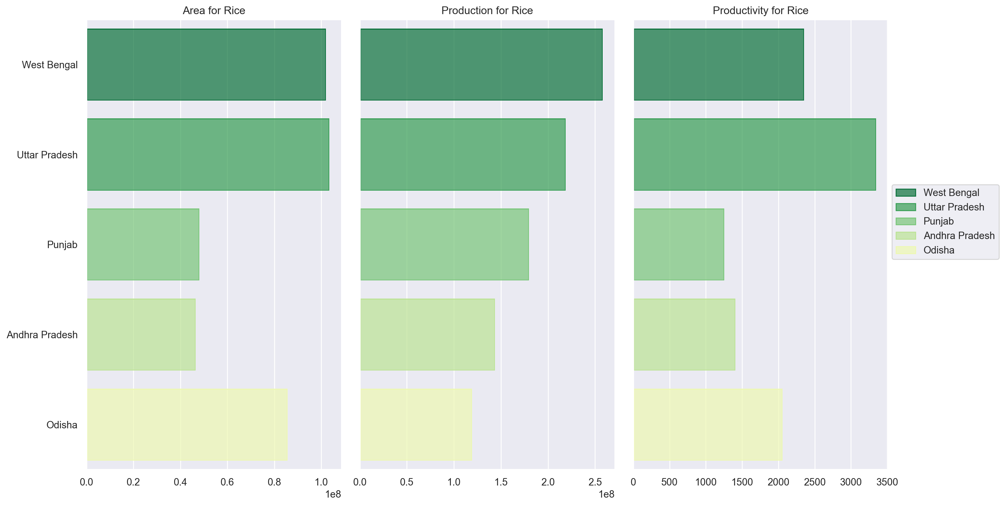

In [207]:
(so.Plot(df1, x="Value", y="State_Name",color="State_Name").add(so.Bar()).facet("Type").share(x=False)
 .label(x="",y="",color="",title="{} for Rice".format)
.scale(color=so.Nominal("YlGn_r"))
.layout(size=(14, 8))
.save("Rice.png",dpi=150,bbox_inches='tight'))

## Wheat

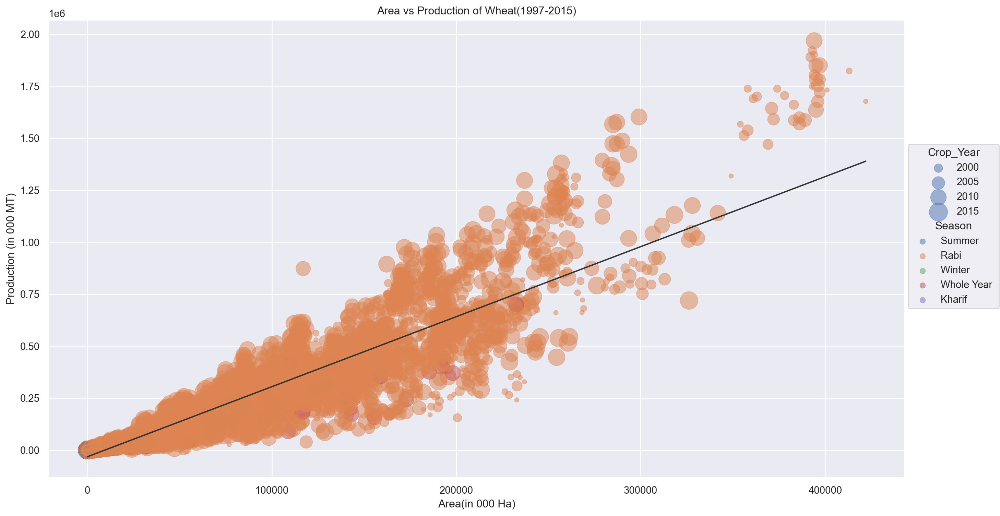

In [208]:
rice_df=crop_df[crop_df["Crop"]=="Wheat"]

df=rice_df[rice_df["Production"]!=0.0]

df.sort_values(by="Crop_Year",ascending=False,inplace=True)

(
    so.Plot(df,x="Area", 
            y='Production')
    .add(so.Line(color=".2"), so.PolyFit(order=1),y="Production")
    .add(so.Dot(alpha=0.5),pointsize="Crop_Year",color="Season")
    .scale(pointsize=(5,20))
    .layout(size=(14, 8))
    .label(x="Area(in 000 Ha)",y="Production (in 000 MT)",
           title="Area vs Production of Wheat(1997-2015)")
    .save("AvPWheat.png",dpi=200,bbox_inches='tight')
)


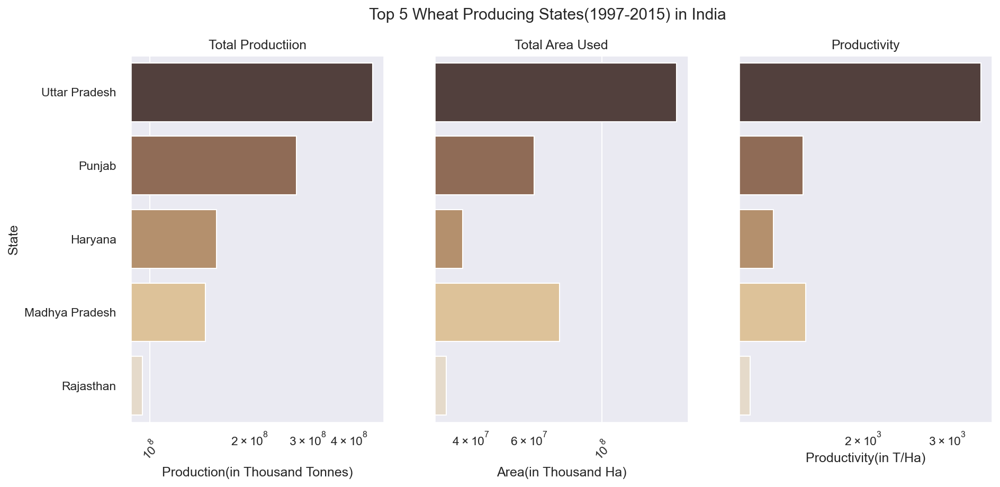

In [209]:
wheat_cmap=["#553d3a","#98694d","#c09061","#e8c48e","#e9dbc6"]
plot_crop_production("Wheat",wheat_cmap)

## Top States

In [210]:
df=crop_df[['State_Name','Production']].groupby(by="State_Name").sum().sort_values(by="Production",ascending=False)
df['State_Name']=df.index

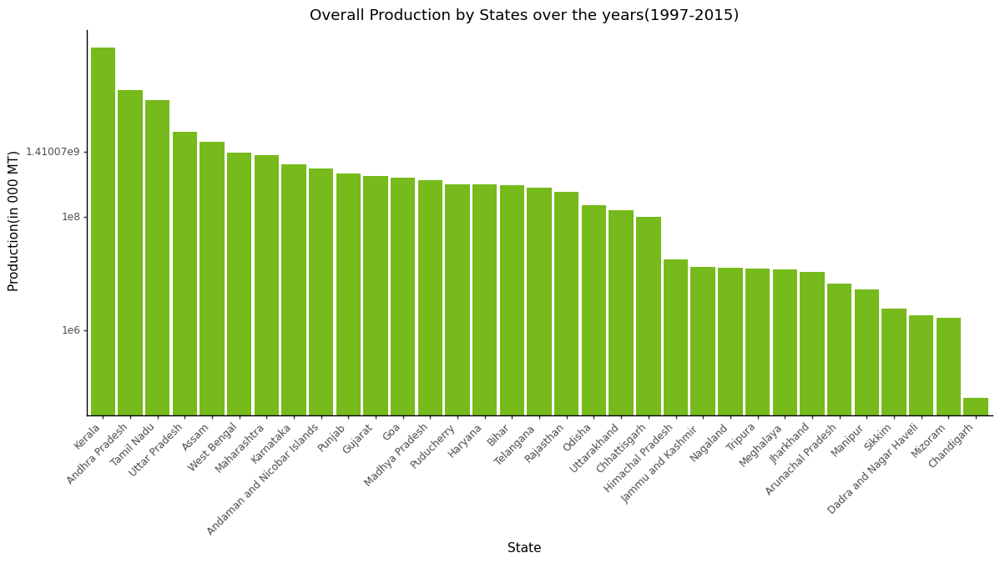

<ggplot: (136791785855)>

In [211]:
p=(ggplot(df, aes(x='reorder(State_Name,Production,ascending=False)', y='Production'))+
 geom_bar(stat='identity',fill='#76BA1B')+
 labs(title='Overall Production by States over the years(1997-2015)', y='Production(in 000 MT)', x='State')+
 scale_y_log10()+
 theme_classic()+
 theme(figure_size=(14,6),axis_text_x=element_text(angle=45, hjust=1),dpi=100))
p.save("Production by States.png",dpi=300)
p

In [212]:
def plot_state_production(state_name):
    df=crop_df[crop_df["State_Name"]==state_name].groupby(["Crop"]).mean().reset_index().sort_values(by="Production",ascending=False)[:5]
    p=(ggplot(df,aes(x="reorder(Crop,Production)",y="Production"))+
       geom_bar(stat="identity",fill="#0077b6")+scale_y_log10()+theme(dpi=150)+
       labs(x="Crop",y="Average Production(in Tonnes)",title=f"Top Crops Produced in {state_name}")+
       coord_flip())
    p.save(f"{state_name} crop.png",dpi=200)
    print(p)

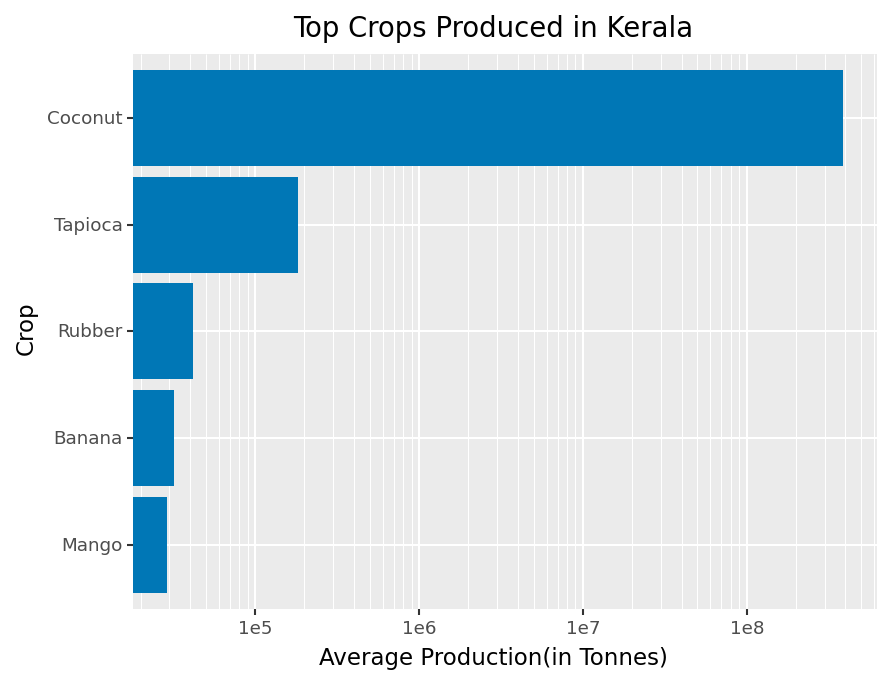

In [213]:
plot_state_production("Kerala")

In [214]:
kerala_data=pd.read_csv('Shift of Area of Important Crops in Kerala from1985-86 to 2004-05.csv')

source = http://www.old.ecostat.kerala.gov.in/images/pdf/publications/Agriculture/data/old/area_crops_8586_0405.pdf

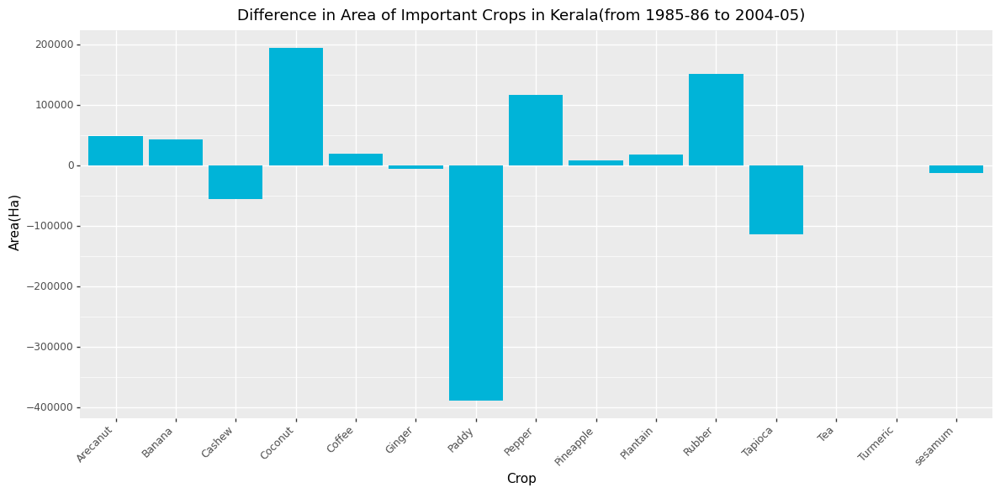

<ggplot: (136786845820)>

In [215]:
p=(ggplot(kerala_data,aes(x="Crop",y="Difference"))+
 geom_bar(stat="identity",fill="#00b4d8")+
 scale_y_continuous(breaks=range(-600000, 300000, 100000))+
 labs(y="Area(Ha)",title="Difference in Area of Important Crops in Kerala(from 1985-86 to 2004-05)")+
 theme(figure_size=(14,6),axis_text_x=element_text(angle=45, hjust=1),dpi=100))
p.save("Kerala Shift in Important Crops.png",dpi=200)
p

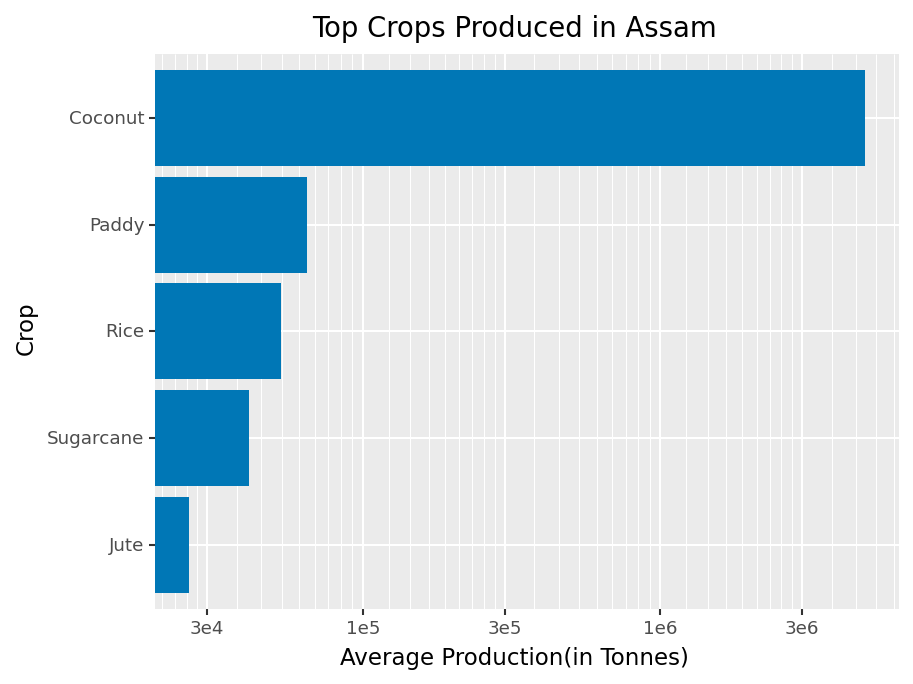

In [216]:
plot_state_production("Assam")

## Decrease in Area 

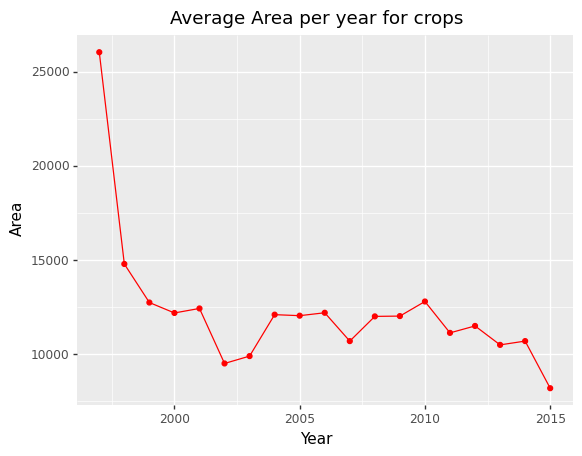

<ggplot: (136772817972)>

In [217]:
df=crop_df[["Area","Crop_Year"]].groupby(by="Crop_Year").mean()
p=(ggplot(df,aes(x=df.index,y="Area"))+geom_line(color="red")+
geom_point(fill="red",color="red")+
labs(x="Year",y="Area",title="Average Area per year for crops"))
p.save("Average Area per year for crops.png",dpi=300)
p

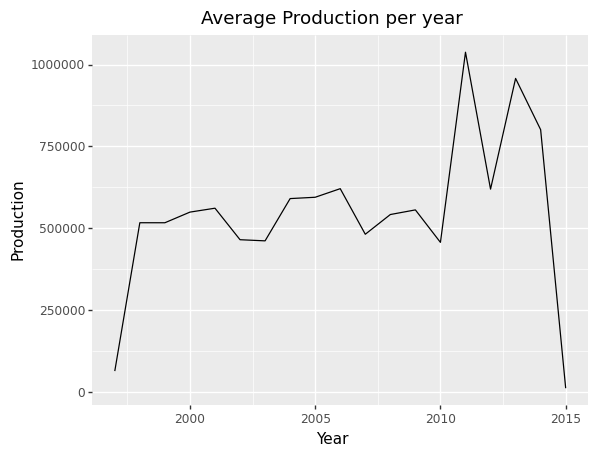

<ggplot: (136778875706)>

In [223]:
df=crop_df[["Crop_Year","Production"]].groupby(by="Crop_Year").mean()
p=ggplot(df,aes(x=df.index,y="Production"))+geom_line()+labs(x="Year",y="Production",title="Average Production per year")
p.save("Average Production per year.png",dpi=300)
p